In [1]:
import torch
from torchvision import datasets, models, io, transforms
from torchvision.transforms import ToTensor
from torch.utils.data import DataLoader, random_split, Dataset
import torch.nn as nn
from torch.autograd import Variable
from torch import optim
from torchsummary import summary
import segmentation_models_pytorch as smp
from sklearn.metrics import roc_auc_score, RocCurveDisplay, roc_curve, auc
from sklearn.preprocessing import LabelBinarizer
from skimage.measure import label, regionprops
from skimage.io import imsave as skimsave

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

import PIL
import os
import shutil
from tqdm import tqdm, trange
import cv2
import PIL
import numpy as np
import pandas as pd
import random
import math
from itertools import cycle
import collections, functools, operator
import matplotlib.pyplot as plt
%matplotlib inline

/home/msarava7/.conda/envs/swin_v2_c11/lib/python3.7/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
%cd /home/msarava7/WarmUpExer/

/home/msarava7/WarmUpExer


In [3]:
!nvcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2022 NVIDIA Corporation
Built on Thu_Feb_10_18:23:41_PST_2022
Cuda compilation tools, release 11.6, V11.6.112
Build cuda_11.6.r11.6/compiler.30978841_0


In [4]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

# Dataset Downloading and Unzipping

In [ ]:
!wget http://imgcom.jsrt.or.jp/imgcom/wp-content/uploads/2019/07/Practice_PNGandJPG.zip

In [3]:
!wget http://imgcom.jsrt.or.jp/imgcom/wp-content/uploads/2019/07/Practice_DICOM.zip

--2023-01-26 12:02:47--  http://imgcom.jsrt.or.jp/imgcom/wp-content/uploads/2019/07/Practice_DICOM.zip
Resolving imgcom.jsrt.or.jp (imgcom.jsrt.or.jp)... 158.199.228.161
Connecting to imgcom.jsrt.or.jp (imgcom.jsrt.or.jp)|158.199.228.161|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 54755233 (52M) [application/zip]
Saving to: ‘Practice_DICOM.zip’

100%[======================================>] 54,755,233   579KB/s   in 58s    

2023-01-26 12:03:46 (914 KB/s) - ‘Practice_DICOM.zip’ saved [54755233/54755233]



In [4]:
!wget http://imgcom.jsrt.or.jp/imgcom/wp-content/uploads/2018/11/Directions01.zip

--2023-01-26 12:03:46--  http://imgcom.jsrt.or.jp/imgcom/wp-content/uploads/2018/11/Directions01.zip
Resolving imgcom.jsrt.or.jp (imgcom.jsrt.or.jp)... 158.199.228.161
Connecting to imgcom.jsrt.or.jp (imgcom.jsrt.or.jp)|158.199.228.161|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 13005411 (12M) [application/zip]
Saving to: ‘Directions01.zip’

100%[======================================>] 13,005,411  1.35MB/s   in 13s    

2023-01-26 12:03:59 (964 KB/s) - ‘Directions01.zip’ saved [13005411/13005411]



In [5]:
!wget http://imgcom.jsrt.or.jp/imgcom/wp-content/uploads/2018/11/Gender01.zip

--2023-01-26 12:04:00--  http://imgcom.jsrt.or.jp/imgcom/wp-content/uploads/2018/11/Gender01.zip
Resolving imgcom.jsrt.or.jp (imgcom.jsrt.or.jp)... 158.199.228.161
Connecting to imgcom.jsrt.or.jp (imgcom.jsrt.or.jp)|158.199.228.161|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5916956 (5.6M) [application/zip]
Saving to: ‘Gender01.zip’

100%[======================================>] 5,916,956    611KB/s   in 11s    

2023-01-26 12:04:11 (503 KB/s) - ‘Gender01.zip’ saved [5916956/5916956]



In [6]:
!wget http://imgcom.jsrt.or.jp/imgcom/wp-content/uploads/2019/07/XPAge01_RGB.zip

--2023-01-26 12:04:12--  http://imgcom.jsrt.or.jp/imgcom/wp-content/uploads/2019/07/XPAge01_RGB.zip
Resolving imgcom.jsrt.or.jp (imgcom.jsrt.or.jp)... 158.199.228.161
Connecting to imgcom.jsrt.or.jp (imgcom.jsrt.or.jp)|158.199.228.161|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 39118132 (37M) [application/zip]
Saving to: ‘XPAge01_RGB.zip’

100%[======================================>] 39,118,132  1.19MB/s   in 52s    

2023-01-26 12:05:04 (730 KB/s) - ‘XPAge01_RGB.zip’ saved [39118132/39118132]



In [12]:
!unzip Practice_PNGandJPG.zip

Archive:  Practice_PNGandJPG.zip
  inflating: Practice_PNGandJPG/chestimage_JPG/JPCLN001.jpg  
  inflating: Practice_PNGandJPG/chestimage_JPG/JPCLN002.jpg  
  inflating: Practice_PNGandJPG/chestimage_JPG/JPCLN003.jpg  
  inflating: Practice_PNGandJPG/chestimage_JPG/JPCLN004.jpg  
  inflating: Practice_PNGandJPG/chestimage_JPG/JPCLN005.jpg  
  inflating: Practice_PNGandJPG/chestimage_JPG/JPCNN001.jpg  
  inflating: Practice_PNGandJPG/chestimage_JPG/JPCNN002.jpg  
  inflating: Practice_PNGandJPG/chestimage_JPG/JPCNN003.jpg  
  inflating: Practice_PNGandJPG/chestimage_JPG/JPCNN004.jpg  
  inflating: Practice_PNGandJPG/chestimage_JPG/JPCNN005.jpg  
  inflating: Practice_PNGandJPG/chestimage_PNG/JPCLN001.png  
  inflating: Practice_PNGandJPG/chestimage_PNG/JPCLN002.png  
  inflating: Practice_PNGandJPG/chestimage_PNG/JPCLN003.png  
  inflating: Practice_PNGandJPG/chestimage_PNG/JPCLN004.png  
  inflating: Practice_PNGandJPG/chestimage_PNG/JPCLN005.png  
  inflating: Practice_PNGandJPG/chest

In [13]:
!unzip Practice_DICOM.zip

Archive:  Practice_DICOM.zip
  inflating: Practice_DICOM/chestimages_DICOM/JPCLN001.dcm  
  inflating: Practice_DICOM/chestimages_DICOM/JPCLN002.dcm  
  inflating: Practice_DICOM/chestimages_DICOM/JPCLN003.dcm  
  inflating: Practice_DICOM/chestimages_DICOM/JPCLN004.dcm  
  inflating: Practice_DICOM/chestimages_DICOM/JPCLN005.dcm  
  inflating: Practice_DICOM/chestimages_DICOM/JPCNN001.dcm  
  inflating: Practice_DICOM/chestimages_DICOM/JPCNN002.dcm  
  inflating: Practice_DICOM/chestimages_DICOM/JPCNN003.dcm  
  inflating: Practice_DICOM/chestimages_DICOM/JPCNN004.dcm  
  inflating: Practice_DICOM/chestimages_DICOM/JPCNN005.dcm  


In [ ]:
!unzip Directions01.zip

In [ ]:
!unzip Gender01.zip

In [ ]:
!unzip XPAge01_RGB.zip

# Task 1

Reading and writing PNG/IMG files

In [17]:
os.makedirs('Practice_PNGandJPG/WrittenImages')

In [18]:
def read_image(img_path):
  img = cv2.imread(img_path)
  plt.imshow(img)
  return img

In [19]:
def write_image(img,img_path):
  cv2.imwrite(img_path,img)

In [35]:
def read_image_io(img_path):
  img = io.read_image(img_path, io.image.ImageReadMode.RGB)
  plt.imshow(img.permute(1,2,0))
  return img

In [21]:
def write_jpeg_io(img, img_path):
  io.write_jpeg(img, img_path)

In [22]:
def write_png_io(img, img_path):
  io.write_png(img, img_path)

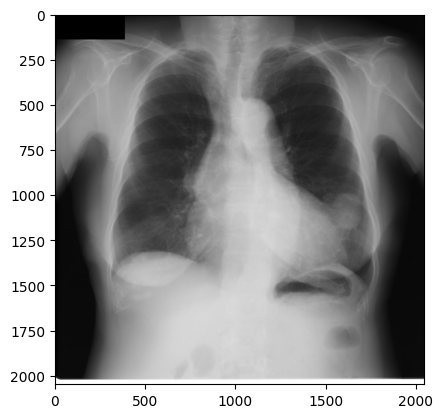

In [25]:
jpgimg1 = read_image('Practice_PNGandJPG/chestimage_JPG/JPCLN002.jpg')

In [26]:
write_image(jpgimg1, 'Practice_PNGandJPG/WrittenImages/JPCLN002ReWritten.jpg')

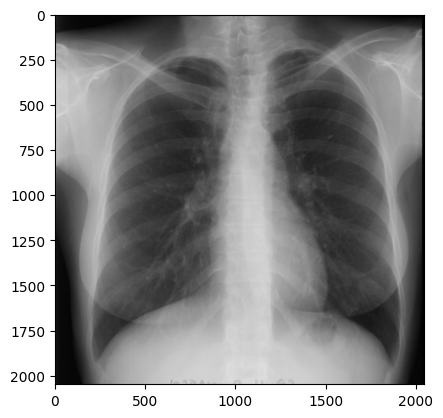

In [27]:
pngimg1 = read_image('Practice_PNGandJPG/chestimage_PNG/JPCNN001.png')

In [28]:
write_image(pngimg1, 'Practice_PNGandJPG/WrittenImages/JPCNN001ReWritten.png')

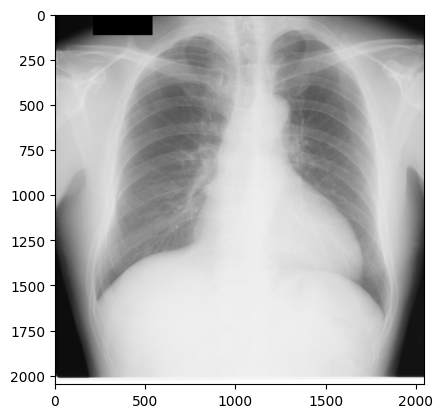

In [36]:
jpgimg2 = read_image_io('Practice_PNGandJPG/chestimage_JPG/JPCNN004.jpg')

In [38]:
write_jpeg_io(jpgimg2, 'Practice_PNGandJPG/WrittenImages/JPCNN004ReWritten.jpg')

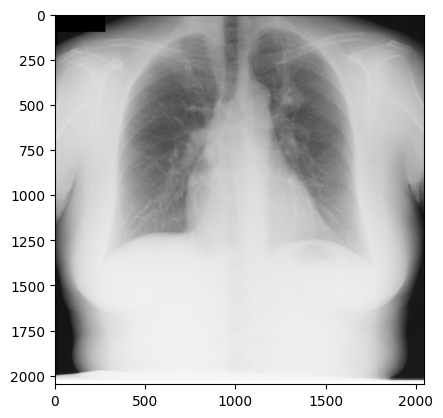

In [39]:
pngimg2 = read_image_io('Practice_PNGandJPG/chestimage_PNG/JPCLN003.png')

In [40]:
write_png_io(pngimg2,'Practice_PNGandJPG/WrittenImages/JPCLN003ReWritten.png')

Reading and writing DICOM images

In [41]:
dcimage1 = pydicom.dcmread('Practice_DICOM/chestimages_DICOM/JPCLN002.dcm')
dcimage1

Dataset.file_meta -------------------------------
(0002, 0000) File Meta Information Group Length  UL: 230
(0002, 0001) File Meta Information Version       OB: b'\x00\x01'
(0002, 0002) Media Storage SOP Class UID         UI: Secondary Capture Image Storage
(0002, 0003) Media Storage SOP Instance UID      UI: 1.3.6.1.4.1.9590.100.1.2.254394680913334393337502798350835638458
(0002, 0010) Transfer Syntax UID                 UI: Explicit VR Little Endian
(0002, 0012) Implementation Class UID            UI: 1.3.6.1.4.1.9590.100.1.3.100.7.1
(0002, 0013) Implementation Version Name         SH: 'MATLAB IPT 7.1'
(0002, 0016) Source Application Entity Title     AE: 'PAPYRUS 3.0'
-------------------------------------------------
(0008, 0016) SOP Class UID                       UI: Secondary Capture Image Storage
(0008, 0018) SOP Instance UID                    UI: 1.3.6.1.4.1.9590.100.1.2.254394680913334393337502798350835638458
(0008, 0020) Study Date                          DA: '19940823'
(0008,

In [42]:
dcimage1.dir("pat")

['ImageOrientationPatient',
 'ImagePositionPatient',
 'PatientBirthDate',
 'PatientID',
 'PatientName',
 'PatientSex']

In [43]:
dcimage1.PatientSex

'F'

In [44]:
dcimgarr = dcimage1.pixel_array
dcimgarr

array([[   0,    0,    0, ...,  131,  129,  130],
       [   0,    0,    0, ...,  129,  129,  129],
       [   0,    0,    0, ...,  127,  127,  127],
       ...,
       [ 892, 1527, 3179, ..., 4093, 4090, 4090],
       [ 888, 1452, 3148, ..., 4093, 4095, 4091],
       [ 901, 1541, 3191, ..., 4095, 4095, 4095]], dtype=uint16)

In [45]:
dcimgarr.shape

(2048, 2048)

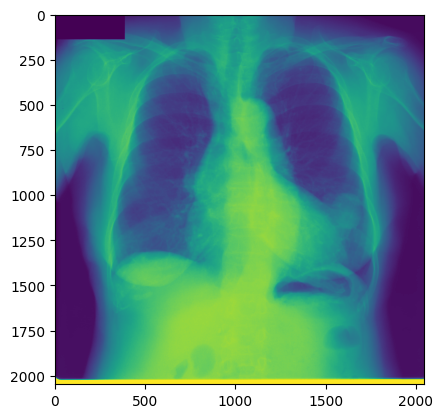

In [46]:
plt.imshow(dcimgarr)

In [47]:
os.makedirs('Practice_DICOM/WrittenImagesDICOM')

In [48]:
dcimage1.save_as('Practice_DICOM/WrittenImagesDICOM/JPCLN002ReWritten.dcm')

In [49]:
def read_dicom(img_path):
  img = pydicom.dcmread(img_path)
  plt.imshow(img.pixel_array)
  return img

In [50]:
def write_dicom(img, img_path):
  img.save_as(img_path)

Dataset.file_meta -------------------------------
(0002, 0000) File Meta Information Group Length  UL: 230
(0002, 0001) File Meta Information Version       OB: b'\x00\x01'
(0002, 0002) Media Storage SOP Class UID         UI: Secondary Capture Image Storage
(0002, 0003) Media Storage SOP Instance UID      UI: 1.3.6.1.4.1.9590.100.1.2.183650747511147325327649207382057390257
(0002, 0010) Transfer Syntax UID                 UI: Explicit VR Little Endian
(0002, 0012) Implementation Class UID            UI: 1.3.6.1.4.1.9590.100.1.3.100.7.1
(0002, 0013) Implementation Version Name         SH: 'MATLAB IPT 7.1'
(0002, 0016) Source Application Entity Title     AE: 'PAPYRUS 3.0'
-------------------------------------------------
(0008, 0016) SOP Class UID                       UI: Secondary Capture Image Storage
(0008, 0018) SOP Instance UID                    UI: 1.3.6.1.4.1.9590.100.1.2.183650747511147325327649207382057390257
(0008, 0020) Study Date                          DA: '19940823'
(0008,

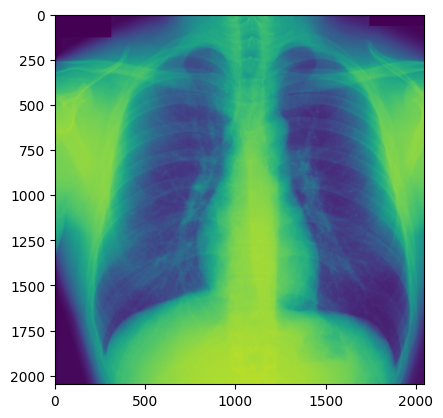

In [52]:
dcimage2 = read_dicom('Practice_DICOM/chestimages_DICOM/JPCNN005.dcm')
print(dcimage2)

In [53]:
write_dicom(dcimage2, 'Practice_DICOM/WrittenImagesDICOM/JPCNN005ReWritten.dcm')

# Task 2 - Orientation Classification

In [5]:
transforms_train = transforms.Compose([
    transforms.Resize((224, 224)),   #must same as here
    transforms.ColorJitter(),
    transforms.GaussianBlur(kernel_size=(5, 9)),
    transforms.RandomAdjustSharpness(sharpness_factor=2),
    transforms.RandomEqualize(), # data augmentation
    transforms.ToTensor(),
    #transforms.Normalize([0.485], [0.229]) # normalization
])
transforms_test = transforms.Compose([
    transforms.Resize((224, 224)),   #must same as here
    transforms.ColorJitter(),
    transforms.GaussianBlur(kernel_size=(5, 9)),
    transforms.RandomAdjustSharpness(sharpness_factor=2),
    transforms.RandomAutocontrast(),
    transforms.RandomEqualize(), # data augmentation
    transforms.ToTensor(),
    #transforms.Normalize([0.485], [0.229])
])

transforms_train_new = transforms.Compose([
    transforms.Resize((224, 224)), # data augmentation
    transforms.ToTensor(),
    #transforms.Normalize([0.485], [0.229]) # normalization
])
transforms_test_new = transforms.Compose([
    transforms.Resize((224, 224)), # data augmentation
    transforms.ToTensor(),
    #transforms.Normalize([0.485], [0.229])
])

In [6]:
train_path = "Directions01/train"
test_path = "Directions01/test"

In [7]:
train_data = datasets.ImageFolder(train_path, transforms_train_new)
test_data = datasets.ImageFolder(test_path, transforms_test_new)

In [8]:
print(train_data)
print(test_data)

Dataset ImageFolder
    Number of datapoints: 948
    Root location: Directions01/train
    StandardTransform
Transform: Compose(
               Resize(size=(224, 224), interpolation=bilinear)
               ToTensor()
           )
Dataset ImageFolder
    Number of datapoints: 40
    Root location: Directions01/test
    StandardTransform
Transform: Compose(
               Resize(size=(224, 224), interpolation=bilinear)
               ToTensor()
           )


In [9]:
class_names = train_data.classes
class_names

['down', 'left', 'right', 'up']

In [10]:
num_classes = len(train_data.classes)
num_classes

4

In [11]:
img, label = train_data[22]
print(img.shape, label)

torch.Size([3, 224, 224]) 0


In [12]:
img, label = test_data[22]
print(img.shape, label)

torch.Size([3, 224, 224]) 2


In [13]:
print(f"Images in train data : {len(train_data)}")
print(f"Images in test data : {len(test_data)}")

Images in train data : 948
Images in test data : 40


In [14]:
def display_img(img,label):
    print(f"Label : {train_data.classes[label]}")
    plt.imshow(img.permute(1,2,0))#.type(torch.ByteTensor))

243
Label : left


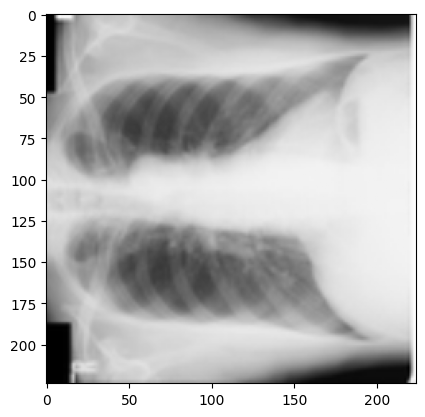

In [15]:
idx = random.randint(0,947)
print(idx)
display_img(*train_data[idx])

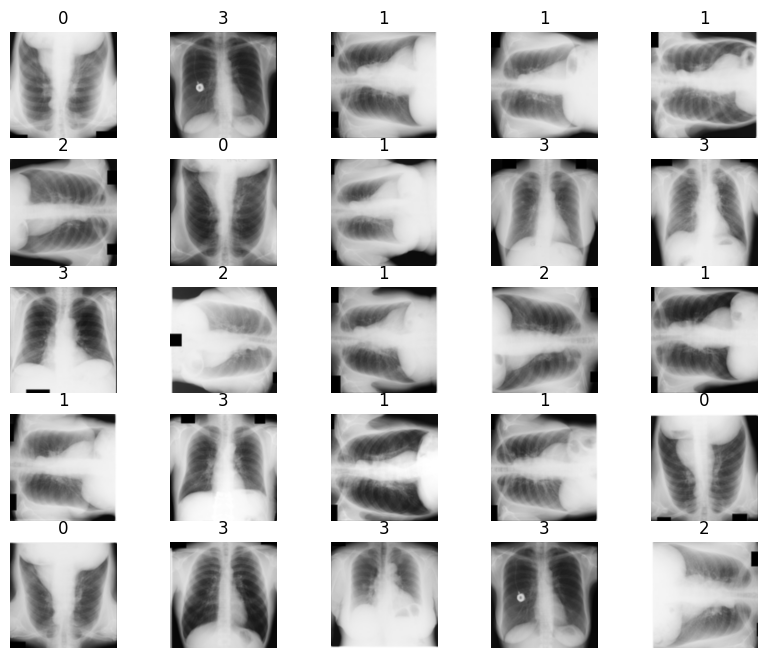

In [16]:
figure = plt.figure(figsize=(10, 8)) 
cols, rows = 5, 5
for i in range(1, cols * rows + 1):
  sample_idx = torch.randint(len(train_data), size=(1,)).item() 
  img, label = train_data[sample_idx]
  figure.add_subplot(rows, cols, i)
  plt.title(label)
  plt.axis("off")
  plt.imshow(img.permute(1,2,0))#.type(torch.ByteTensor))
plt.show()

In [17]:
random_seed = 267
torch.manual_seed(random_seed)

In [18]:
val_size = int(0.3 * len(train_data))
print(val_size)
train_size = len(train_data) - val_size
print(train_size)

284
664


In [19]:
train_set, val_set = random_split(train_data,[train_size,val_size])
print(f"Length of Train Data : {len(train_set)}")
print(f"Length of Validation Data : {len(val_set)}")

Length of Train Data : 664
Length of Validation Data : 284


In [20]:
batch = 32

In [21]:
loaders = {'train': DataLoader(train_set, batch_size=batch, shuffle=True, num_workers=1),
           'val': DataLoader(val_set, batch_size=batch, shuffle=True, num_workers=1),
           'test' : DataLoader(test_data, batch_size=batch, shuffle=True, num_workers=1)}
loaders

{'train': <torch.utils.data.dataloader.DataLoader at 0x2b60e2274d10>,
 'val': <torch.utils.data.dataloader.DataLoader at 0x2b60e2274d50>,
 'test': <torch.utils.data.dataloader.DataLoader at 0x2b60e2274e10>}

In [22]:
from torchvision.utils import make_grid

def show_batch(dl):
    for images, labels in dl:
        fig,ax = plt.subplots(figsize = (8,12))
        ax.set_xticks([])
        ax.set_yticks([])
        ax.imshow(make_grid(images,nrow=8).permute(1,2,0))
        break

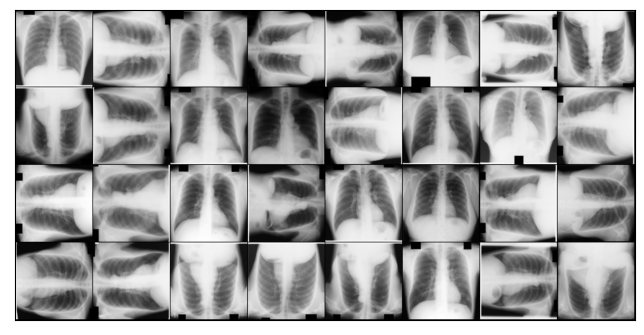

In [23]:
show_batch(loaders['train'])

In [24]:
class Base(nn.Module):
  def training_step(self, batch, loss_func):
    images, labels = batch
    images = images.to(device)
    labels = labels.to(device)
    output = self(images)
    train_loss = loss_func(output, labels)
    train_acc = accuracy(output, labels)
    return {'train_loss': train_loss, 'train_acc': train_acc}
  
  def validation_step(self, batch, loss_func):
    images, labels = batch
    images = images.to(device)
    labels = labels.to(device)
    output = self(images)
    val_loss = loss_func(output, labels)
    val_acc = accuracy(output, labels)
    return {'val_loss': val_loss.detach(), 'val_acc': val_acc}

  def validation_epoch_end(self, outputs):
    batch_loss = [x['val_loss'] for x in outputs]
    epoch_loss = torch.stack(batch_loss).mean()
    batch_acc = [x['val_acc'] for x in outputs]
    epoch_acc = torch.stack(batch_acc).mean()
    return {'loss': epoch_loss.item(), 'acc': epoch_acc.item()}

  def epoch_end(self, epoch, result):
    print("Epoch [{}], train_loss: {:.4f}, train_acc: {:.4f}, val_loss: {:.4f}, val_acc: {:.4f}".format(
            epoch, result['train_loss'], result['train_acc'], result['loss'], result['acc']))

In [25]:
def accuracy(outputs, labels):
  _, preds = torch.max(outputs, 1)
  return torch.tensor(torch.sum(preds == labels).item()/ len(preds))

In [26]:
def evaluate(model, val_loader, loss_func):
  model.eval()
  outputs = [model.validation_step(batch, loss_func) for batch in val_loader]
  return model.validation_epoch_end(outputs)

In [27]:
def model_fit(num_epochs, model, loaders, loss_func, optimizer):
  history = []
  train_batch_loss = []
  train_batch_acc = []

  for epoch in range(num_epochs):
    model.train()
    for batch in loaders['train']:
      train_step_res = model.training_step(batch, loss_func)
      train_step_loss = train_step_res['train_loss']
      train_batch_loss.append(train_step_loss)
      train_batch_acc.append(train_step_res['train_acc'])
      # clear gradients for this training step
      optimizer.zero_grad()
      # backpropagation, compute gradients
      train_step_loss.backward()
      # apply gradients
      optimizer.step()
    
    result = evaluate(model, loaders['val'], loss_func)
    result['train_loss'] = torch.stack(train_batch_loss).mean().item()
    result['train_acc'] = torch.stack(train_batch_acc).mean().item()
    model.epoch_end(epoch, result)
    history.append(result)
    
  return history

In [28]:
class ResNet18(Base):
  def __init__(self):
    super(ResNet18, self).__init__()

    resnet18 = models.resnet18(pretrained=True) #(weights=None)
    resnet18.fc = nn.Linear(resnet18.fc.in_features, num_classes)
    self.resnet = resnet18

  def forward(self, x):
    output = self.resnet(x)
    return output

In [29]:
resnet = ResNet18()
resnet = resnet.to(device)

In [30]:
loss_func = nn.CrossEntropyLoss() 
loss_func

CrossEntropyLoss()

In [31]:
optimizerRes = optim.Adam(resnet.parameters(), lr = 0.01) 
optimizerRes

Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    lr: 0.01
    weight_decay: 0
)

In [32]:
num_epochs = 15

In [33]:
for images, labels in loaders['train']:
    print('images.shape:', images.shape)
    b_x = images.to(device)
    out = resnet(b_x)
    print('out.shape:', out.shape)
    print('out[0]:', out[0])
    break

images.shape: torch.Size([32, 3, 224, 224])
out.shape: torch.Size([32, 4])
out[0]: tensor([ 0.3316, -0.4658, -0.4473,  0.3442], device='cuda:0',
       grad_fn=<SelectBackward>)


In [34]:
history = model_fit(num_epochs, resnet, loaders, loss_func, optimizerRes)

Epoch [0], train_loss: 0.6659, train_acc: 0.8199, val_loss: 48.0223, val_acc: 0.5055
Epoch [1], train_loss: 0.3538, train_acc: 0.9040, val_loss: 5.6439, val_acc: 0.7326
Epoch [2], train_loss: 0.2421, train_acc: 0.9355, val_loss: 0.0058, val_acc: 1.0000
Epoch [3], train_loss: 0.1855, train_acc: 0.9509, val_loss: 0.0318, val_acc: 0.9896
Epoch [4], train_loss: 0.1513, train_acc: 0.9598, val_loss: 0.0121, val_acc: 0.9965
Epoch [5], train_loss: 0.1271, train_acc: 0.9665, val_loss: 0.0001, val_acc: 1.0000
Epoch [6], train_loss: 0.1152, train_acc: 0.9698, val_loss: 0.0778, val_acc: 0.9752
Epoch [7], train_loss: 0.1052, train_acc: 0.9723, val_loss: 0.0051, val_acc: 0.9965
Epoch [8], train_loss: 0.0968, train_acc: 0.9744, val_loss: 0.0261, val_acc: 0.9861
Epoch [9], train_loss: 0.0905, train_acc: 0.9760, val_loss: 0.4144, val_acc: 0.9370
Epoch [10], train_loss: 0.0858, train_acc: 0.9773, val_loss: 0.0059, val_acc: 0.9965
Epoch [11], train_loss: 0.0795, train_acc: 0.9790, val_loss: 0.0156, val_a

In [35]:
print('Test accuracy of the 10000 images:')
evaluate(resnet, loaders['test'], loss_func)

Test accuracy of the 10000 images:


{'loss': 3.222367013222538e-07, 'acc': 1.0}

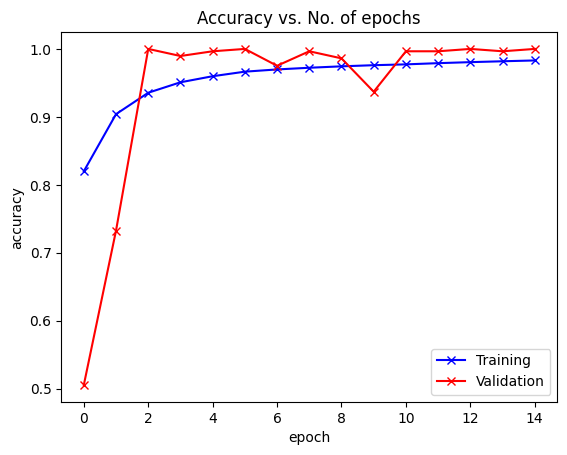

In [36]:
def plot_accuracies(history):
    """ Plot the history of accuracies"""
    train_acc = [x['train_acc'] for x in history]
    val_acc = [x['acc'] for x in history]
    plt.plot(train_acc, '-bx')
    plt.plot(val_acc, '-rx')
    plt.xlabel('epoch')
    plt.ylabel('accuracy')
    plt.legend(['Training', 'Validation'])
    plt.title('Accuracy vs. No. of epochs');
    

plot_accuracies(history)

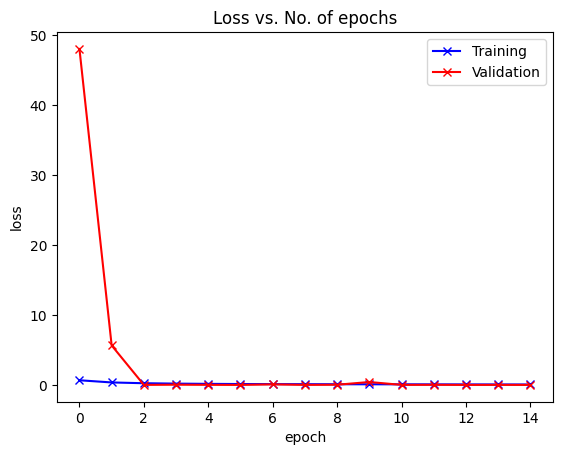

In [37]:
def plot_losses(history):
    """ Plot the losses in each epoch"""
    train_losses = [x.get('train_loss') for x in history]
    val_losses = [x['loss'] for x in history]
    plt.plot(train_losses, '-bx')
    plt.plot(val_losses, '-rx')
    plt.xlabel('epoch')
    plt.ylabel('loss')
    plt.legend(['Training', 'Validation'])
    plt.title('Loss vs. No. of epochs');

plot_losses(history)

In [38]:
sample = next(iter(loaders['test'])) 
imgs, lbls = sample

In [39]:
actual_number = lbls.numpy() 
actual_number

array([2, 3, 0, 1, 2, 0, 3, 1, 1, 3, 2, 3, 1, 2, 0, 2, 3, 0, 2, 1, 1, 0,
       2, 3, 1, 3, 1, 3, 2, 0, 3, 0])

In [40]:
imgs = imgs.to(device)
lbls = lbls.to(device)

In [41]:
test_output = resnet(imgs)
test_output = test_output.to('cpu')
pred_y = torch.max(test_output, 1)[1].data.numpy().squeeze() 
print(f'Prediction number: {pred_y}')
print(f'Actual number    : {actual_number}')

Prediction number: [2 3 0 1 2 0 3 1 1 3 2 3 1 2 0 2 3 0 2 1 1 0 2 3 1 3 1 3 2 0 3 0]
Actual number    : [2 3 0 1 2 0 3 1 1 3 2 3 1 2 0 2 3 0 2 1 1 0 2 3 1 3 1 3 2 0 3 0]


#### Explainability

In [42]:
model = resnet
target_layers = [model.resnet.layer4[-1]]

In [43]:
images, labels = imgs, lbls

In [44]:
images.shape

torch.Size([32, 3, 224, 224])

In [45]:
# Construct the CAM object once, and then re-use it on many images:
cam = GradCAM(model=model, target_layers=target_layers, use_cuda=True)

In [46]:
# You can also use it within a with statement, to make sure it is freed,
# In case you need to re-create it inside an outer loop:
# with GradCAM(model=model, target_layers=target_layers, use_cuda=args.use_cuda) as cam:
#   ...

# We have to specify the target we want to generate
# the Class Activation Maps for.
# If targets is None, the highest scoring category
# will be used for every image in the batch.
# Here we use ClassifierOutputTarget, but you can define your own custom targets
# That are, for example, combinations of categories, or specific outputs in a non standard model.

targets = [ClassifierOutputTarget(3)]

In [47]:
# You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
grayscale_cam = cam(input_tensor=images, targets=None)

In [48]:
grayscale_cam.shape

(32, 224, 224)

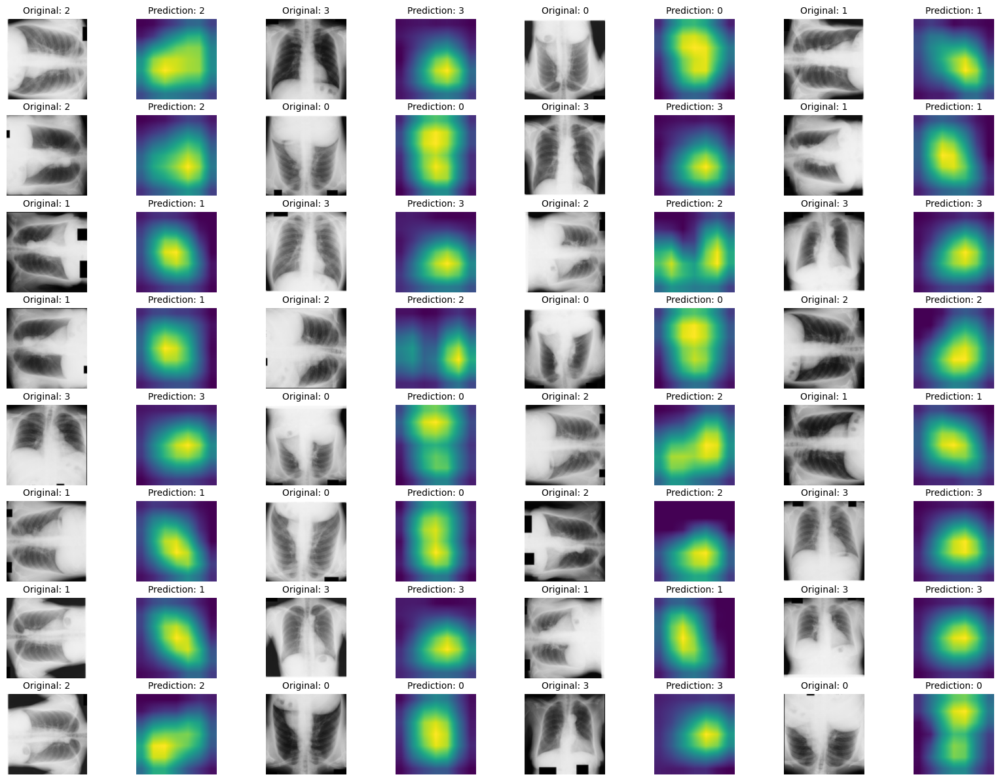

In [49]:
figure = plt.figure(figsize=(20, 15)) 
cols, rows = 8, 8
j = 0
for i in range(1, cols * rows + 1): 
    img, label, pred = images[j], labels[j], pred_y[j]
    figure.add_subplot(rows, cols, i)
    if i%2 != 0:
        plt.title(f'Original: {label.item()}',fontsize=10)
        plt.axis("off")
        plt.imshow(img.permute(1,2,0).cpu().detach().numpy())
    else:
        plt.title(f'Prediction: {pred.item()}',fontsize=10)
        plt.axis("off")
        plt.imshow(grayscale_cam[j,:,:])
    if i%2 == 0:
        j = j+1
plt.show()

In [50]:
type(grayscale_cam)

numpy.ndarray

In [51]:
images[0][0,:,:].unsqueeze(2).shape

torch.Size([224, 224, 1])

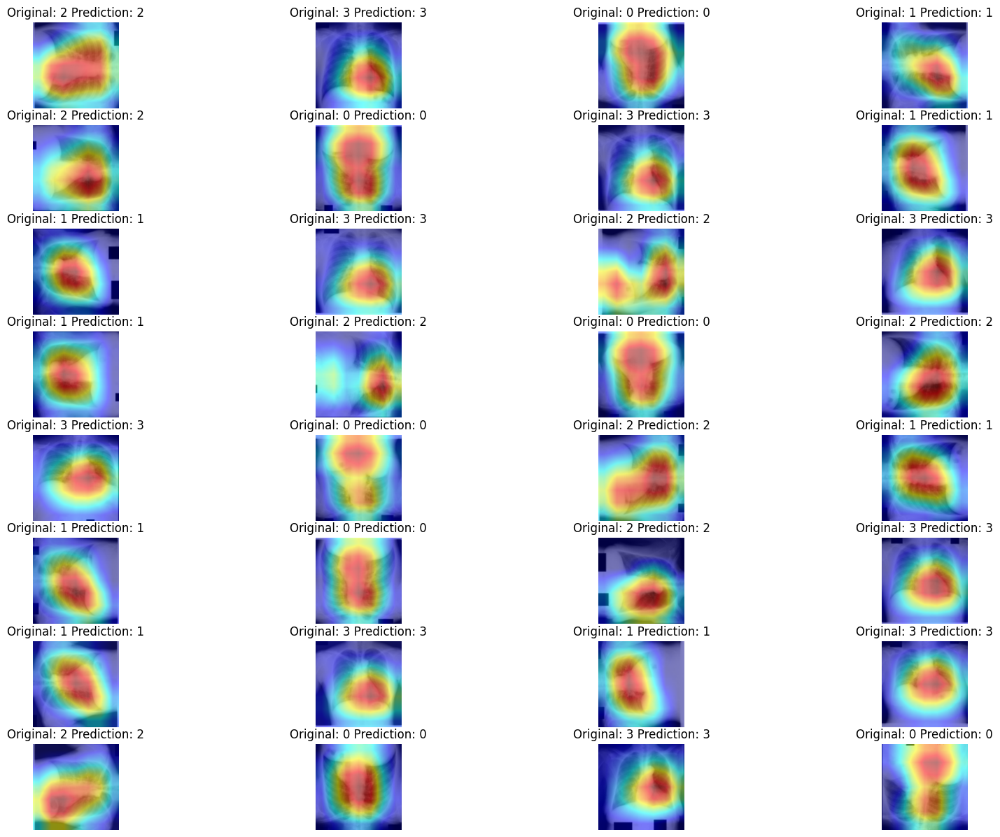

In [52]:
figure = plt.figure(figsize=(20, 15)) 
cols, rows = 4, 8
for i in range(1, cols * rows + 1): 
    image = images[i-1].permute(1,2,0).detach().to('cpu').numpy()
    label = labels[i-1]
    pred = pred_y[i-1]
    mask = grayscale_cam[i-1,:,:]
    figure.add_subplot(rows, cols, i)
    plt.title(f'Original: {label.item()} Prediction: {pred.item()}')
    plt.axis("off")
    plt.imshow(show_cam_on_image(image, mask, use_rgb=True))
plt.show()
#visualization = show_cam_on_image(images[0].permute(1,2,0).detach().numpy(), grayscale_cam[0,:,:], use_rgb=True)

In [53]:
def identify_wrong_learning_samples(loader, batch_size, model, device):
    image_dict = dict()
    counter = 0
    for batch_id, batch in enumerate(loader):
        images, labels = batch
        output = model(images.to(device)).to('cpu')
        predictions = torch.max(output, 1)[1].data.numpy().squeeze()
        for i in range(len(labels)):
            if labels[i]!=predictions[i]:
                image_dict[batch_id*batch_size+i]={'image':images[i],'label':labels[i],'pred':predictions[i]}
            else:
                counter = counter+1
                
    return image_dict, counter

In [54]:
image_dict, counter = identify_wrong_learning_samples(loaders['train'], batch, resnet, device)

In [55]:
len(image_dict)

0

In [56]:
print(counter)

664


In [57]:
y_train = []
for images, labels in loaders['train']:
    y_train.extend(labels.tolist())

In [58]:
y_test = []
y_pred = []
for images, labels in loaders['test']:
    output = resnet(images.to(device)).to('cpu')
    predictions = torch.max(output, 1)[1].data.numpy().squeeze()
    y_pred.extend(predictions.tolist())
    y_test.extend(labels.tolist())

In [59]:
label_binarizer = LabelBinarizer().fit(y_train)
y_onehot_test = np.array(label_binarizer.transform(y_test))
y_onehot_test.shape

(40, 4)

In [60]:
y_onehot_pred = np.array(label_binarizer.transform(y_pred))
y_onehot_pred.shape

(40, 4)

In [61]:
y_onehot_test.ravel()

array([0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0,
       1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1,
       0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1,
       0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0,
       1, 0, 0, 0, 1, 0])

In [62]:
fpr, tpr, roc_auc = dict(), dict(), dict()
fpr["micro"], tpr["micro"], _ = roc_curve(y_onehot_test.ravel(), y_onehot_pred.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
print(f"Micro-averaged One-vs-Rest ROC AUC score:\n{roc_auc['micro']:.2f}")

Micro-averaged One-vs-Rest ROC AUC score:
1.00


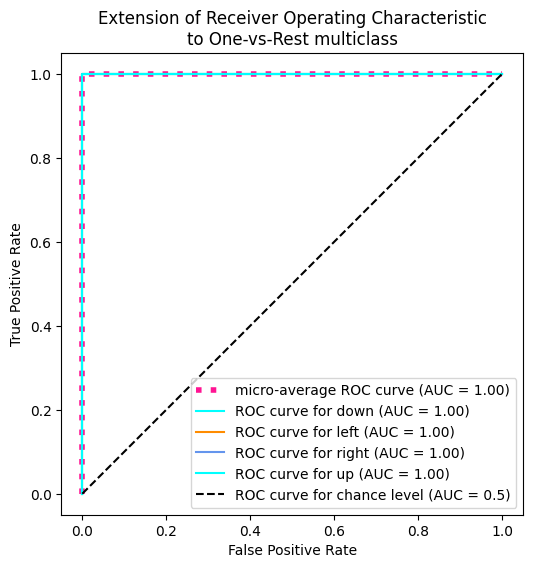

In [64]:
fig, ax = plt.subplots(figsize=(6, 6))

plt.plot(
    fpr["micro"],
    tpr["micro"],
    label=f"micro-average ROC curve (AUC = {roc_auc['micro']:.2f})",
    color="deeppink",
    linestyle=":",
    linewidth=4,
)

colors = cycle(["aqua", "darkorange", "cornflowerblue"])
for class_id, color in zip(range(num_classes), colors):
    RocCurveDisplay.from_predictions(
        y_onehot_test[:, class_id],
        y_onehot_pred[:, class_id],
        name=f"ROC curve for {class_names[class_id]}",
        color=color,
        ax=ax,
    )

plt.plot([0, 1], [0, 1], "k--", label="ROC curve for chance level (AUC = 0.5)")
plt.axis("square")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Extension of Receiver Operating Characteristic\nto One-vs-Rest multiclass")
plt.legend()
plt.show()

# Task 3 - Gender Classification

In [65]:
transforms_train = transforms.Compose([
    transforms.Resize((224, 224)),   #must same as here
    transforms.RandomRotation(degrees=(0, 360)),
    transforms.ToTensor(),
    #transforms.Normalize([0.485], [0.229]) # normalization
])
transforms_test = transforms.Compose([
    transforms.Resize((224, 224)),   #must same as here
    transforms.RandomRotation(degrees=(0, 360)),
    transforms.ToTensor(),
    #transforms.Normalize([0.485], [0.229])
])

transforms_train_new = transforms.Compose([
    transforms.Resize((256, 256)), # data augmentation
    transforms.ToTensor(),
    #transforms.Normalize([0.485], [0.229]) # normalization
])
transforms_test_new = transforms.Compose([
    transforms.Resize((256, 256)), # data augmentation
    transforms.ToTensor(),
    #transforms.Normalize([0.485], [0.229])
])

In [66]:
train_path = "Gender01/train"
test_path = "Gender01/test"


In [67]:
train_data = datasets.ImageFolder(train_path, transforms_train_new)
test_data = datasets.ImageFolder(test_path, transforms_test_new)

In [68]:
print(train_data)
print(test_data)

Dataset ImageFolder
    Number of datapoints: 154
    Root location: Gender01/train
    StandardTransform
Transform: Compose(
               Resize(size=(256, 256), interpolation=bilinear)
               ToTensor()
           )
Dataset ImageFolder
    Number of datapoints: 93
    Root location: Gender01/test
    StandardTransform
Transform: Compose(
               Resize(size=(256, 256), interpolation=bilinear)
               ToTensor()
           )


In [69]:
class_names = train_data.classes
class_names

['female', 'male']

In [70]:
num_classes = len(train_data.classes)
num_classes

2

In [71]:
img, label = train_data[22]
print(img.shape, label)

torch.Size([3, 256, 256]) 0


In [72]:
img, label = test_data[22]
print(img.shape, label)

torch.Size([3, 256, 256]) 0


In [73]:
print(f"Images in train data : {len(train_data)}")
print(f"Images in test data : {len(test_data)}")

Images in train data : 154
Images in test data : 93


In [74]:
def display_img(img,label):
    print(f"Label : {train_data.classes[label]}")
    plt.imshow(img.permute(1,2,0))#.type(torch.ByteTensor))

84
Label : female


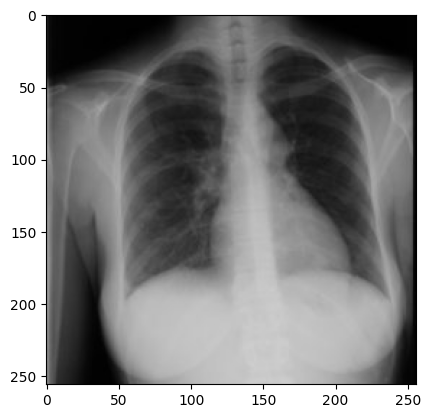

In [75]:
idx = random.randint(0,len(train_data))
print(idx)
display_img(*train_data[idx])

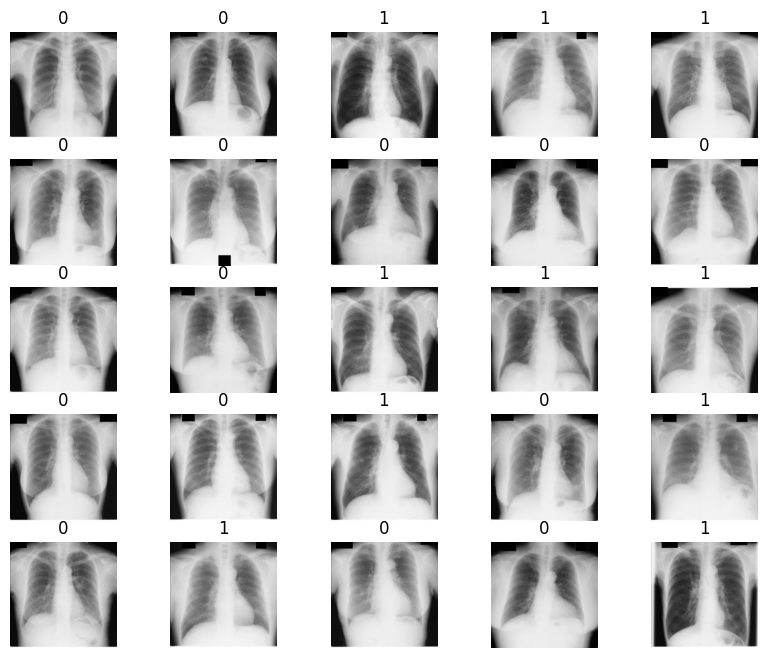

In [76]:
figure = plt.figure(figsize=(10, 8)) 
cols, rows = 5, 5
for i in range(1, cols * rows + 1):
  sample_idx = torch.randint(len(train_data), size=(1,)).item() 
  img, label = train_data[sample_idx]
  figure.add_subplot(rows, cols, i)
  plt.title(label)
  plt.axis("off")
  plt.imshow(img.permute(1,2,0))#.type(torch.ByteTensor))
plt.show()

In [77]:
random_seed = 267
torch.manual_seed(random_seed)

In [78]:
val_size = int(0.2 * len(train_data))
print(val_size)
train_size = len(train_data) - val_size
print(train_size)

30
124


In [79]:
train_set, val_set = random_split(train_data,[train_size,val_size])
print(f"Length of Test Data : {len(train_set)}")
print(f"Length of Validation Data : {len(val_set)}")

Length of Test Data : 124
Length of Validation Data : 30


In [80]:
batch = 16

In [81]:
loaders = {'train': DataLoader(train_set, batch_size=batch, shuffle=True, num_workers=1),
           'val': DataLoader(val_set, batch_size=batch, shuffle=True, num_workers=1),
           'test' : DataLoader(test_data, batch_size=batch, shuffle=True, num_workers=1)}
loaders

{'train': <torch.utils.data.dataloader.DataLoader at 0x2b60e3cb9310>,
 'val': <torch.utils.data.dataloader.DataLoader at 0x2b60e3cb9290>,
 'test': <torch.utils.data.dataloader.DataLoader at 0x2b60e3cb9810>}

In [82]:
from torchvision.utils import make_grid

def show_batch(dl):
    for images, labels in dl:
        fig,ax = plt.subplots(figsize = (8,12))
        ax.set_xticks([])
        ax.set_yticks([])
        ax.imshow(make_grid(images,nrow=8).permute(1,2,0))
        break

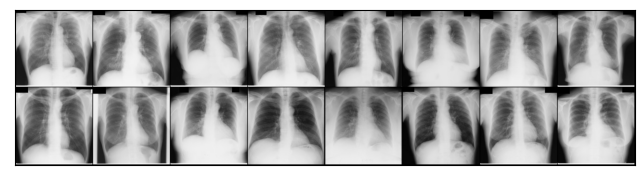

In [83]:
show_batch(loaders['train'])

In [84]:
class Base(nn.Module):
  def training_step(self, batch, loss_func):
    images, labels = batch
    images = images.to(device)
    labels = labels.to(device)
    output = self(images)
    train_loss = loss_func(output, labels)
    train_acc = accuracy(output, labels)
    return {'train_loss': train_loss, 'train_acc': train_acc}
  
  def validation_step(self, batch, loss_func):
    images, labels = batch
    images = images.to(device)
    labels = labels.to(device)
    output = self(images)
    val_loss = loss_func(output, labels)
    val_acc = accuracy(output, labels)
    return {'val_loss': val_loss.detach(), 'val_acc': val_acc}

  def validation_epoch_end(self, outputs):
    batch_loss = [x['val_loss'] for x in outputs]
    epoch_loss = torch.stack(batch_loss).mean()
    batch_acc = [x['val_acc'] for x in outputs]
    epoch_acc = torch.stack(batch_acc).mean()
    return {'loss': epoch_loss.item(), 'acc': epoch_acc.item()}

  def epoch_end(self, epoch, result):
    print("Epoch [{}], train_loss: {:.4f}, train_acc: {:.4f}, val_loss: {:.4f}, val_acc: {:.4f}".format(
            epoch, result['train_loss'], result['train_acc'], result['loss'], result['acc']))

In [85]:
def accuracy(outputs, labels):
  _, preds = torch.max(outputs, 1)
  return torch.tensor(torch.sum(preds == labels).item()/ len(preds))

In [86]:
def evaluate(model, val_loader, loss_func):
  model.eval()
  outputs = [model.validation_step(batch, loss_func) for batch in val_loader]
  return model.validation_epoch_end(outputs)

In [87]:
def model_fit(num_epochs, model, loaders, loss_func, optimizer):
  history = []
  train_batch_loss = []
  train_batch_acc = []

  for epoch in range(num_epochs):
    model.train()
    for batch in loaders['train']:
      train_step_res = model.training_step(batch, loss_func)
      train_step_loss = train_step_res['train_loss']
      train_batch_loss.append(train_step_loss)
      train_batch_acc.append(train_step_res['train_acc'])
      # clear gradients for this training step
      optimizer.zero_grad()
      # backpropagation, compute gradients
      train_step_loss.backward()
      # apply gradients
      optimizer.step()
    
    result = evaluate(model, loaders['val'], loss_func)
    result['train_loss'] = torch.stack(train_batch_loss).mean().item()
    result['train_acc'] = torch.stack(train_batch_acc).mean().item()
    model.epoch_end(epoch, result)
    history.append(result)
    
  return history

In [88]:
class ResNet18(Base):
  def __init__(self):
    super(ResNet18, self).__init__()

    resnet18 = models.resnet18(pretrained=True) #(weights=None)
    resnet18.fc = nn.Linear(resnet18.fc.in_features, num_classes)
    self.resnet = resnet18

  def forward(self, x):
    output = self.resnet(x)
    return output

In [89]:
resnet = ResNet18()
resnet = resnet.to(device)
resnet

ResNet18(
  (resnet): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_run

In [90]:
loss_func = nn.CrossEntropyLoss() 
loss_func

CrossEntropyLoss()

### Optimizer - ADAM

In [100]:
optimizerRes = optim.Adam(resnet.parameters(), lr = 0.01) 
optimizerRes

Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    lr: 0.01
    weight_decay: 0
)

In [101]:
num_epochs = 125

In [102]:
for images, labels in loaders['train']:
    print('images.shape:', images.shape)
    b_x = images.to(device)
    out = resnet(b_x)
    print('out.shape:', out.shape)
    print('out[0]:', out[0])
    break

images.shape: torch.Size([16, 3, 256, 256])
out.shape: torch.Size([16, 2])
out[0]: tensor([ 0.3582, -0.4342], device='cuda:0', grad_fn=<SelectBackward>)


In [103]:
history = model_fit(num_epochs, resnet, loaders, loss_func, optimizerRes)

Epoch [0], train_loss: 1.2830, train_acc: 0.6562, val_loss: 14202274.0000, val_acc: 0.6384
Epoch [1], train_loss: 1.0418, train_acc: 0.6693, val_loss: 31234.7656, val_acc: 0.6295
Epoch [2], train_loss: 0.8851, train_acc: 0.6693, val_loss: 107.2503, val_acc: 0.6652
Epoch [3], train_loss: 0.7870, train_acc: 0.7057, val_loss: 32.5185, val_acc: 0.6250
Epoch [4], train_loss: 0.7141, train_acc: 0.7286, val_loss: 21.5085, val_acc: 0.6205
Epoch [5], train_loss: 0.6772, train_acc: 0.7378, val_loss: 57.4017, val_acc: 0.6250
Epoch [6], train_loss: 0.6630, train_acc: 0.7433, val_loss: 19.7197, val_acc: 0.6295
Epoch [7], train_loss: 0.6404, train_acc: 0.7474, val_loss: 3.7191, val_acc: 0.6295
Epoch [8], train_loss: 0.6408, train_acc: 0.7526, val_loss: 1.5091, val_acc: 0.5402
Epoch [9], train_loss: 0.6163, train_acc: 0.7615, val_loss: 1.0134, val_acc: 0.6116
Epoch [10], train_loss: 0.5910, train_acc: 0.7708, val_loss: 1.9737, val_acc: 0.3616
Epoch [11], train_loss: 0.5633, train_acc: 0.7823, val_los

In [104]:
print('Test accuracy of the images:')
evaluate(resnet, loaders['test'], loss_func)

Test accuracy of the images:


{'loss': 1.3938043117523193, 'acc': 0.7972756028175354}

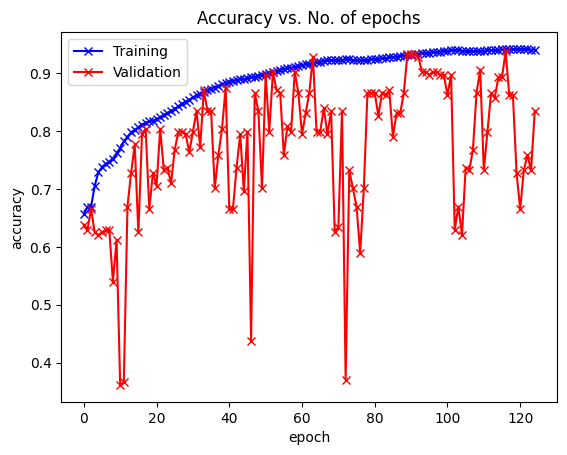

In [105]:
def plot_accuracies(history):
    """ Plot the history of accuracies"""
    train_acc = [x['train_acc'] for x in history]
    val_acc = [x['acc'] for x in history]
    plt.plot(train_acc, '-bx')
    plt.plot(val_acc, '-rx')
    plt.xlabel('epoch')
    plt.ylabel('accuracy')
    plt.legend(['Training', 'Validation'])
    plt.title('Accuracy vs. No. of epochs');
    

plot_accuracies(history)

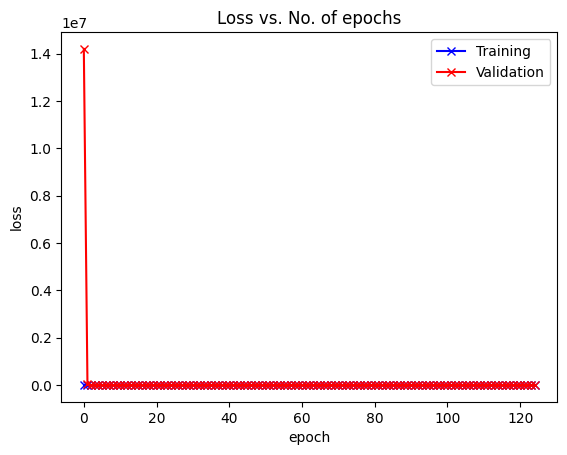

In [106]:
def plot_losses(history):
    """ Plot the losses in each epoch"""
    train_losses = [x.get('train_loss') for x in history]
    val_losses = [x['loss'] for x in history]
    plt.plot(train_losses, '-bx')
    plt.plot(val_losses, '-rx')
    plt.xlabel('epoch')
    plt.ylabel('loss')
    plt.legend(['Training', 'Validation'])
    plt.title('Loss vs. No. of epochs');

plot_losses(history)

In [107]:
sample = next(iter(loaders['test'])) 
imgs, lbls = sample

In [108]:
actual_number = lbls.numpy() 
actual_number

array([0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1])

In [109]:
imgs = imgs.to(device)
lbls = lbls.to(device)

In [110]:
test_output = resnet(imgs)
test_output = test_output.to('cpu')
pred_y = torch.max(test_output, 1)[1].data.numpy().squeeze() 
print(f'Prediction number: {pred_y}')
print(f'Actual number    : {actual_number}')

Prediction number: [0 0 0 0 1 0 0 1 1 1 0 0 0 0 0 1]
Actual number    : [0 0 1 1 1 0 1 1 1 1 0 0 0 0 0 1]


#### Explainability

In [111]:
resnet

ResNet18(
  (resnet): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_run

In [112]:
model = resnet
target_layers = [model.resnet.layer4[-1]]

In [113]:
#images, labels = next(iter(loaders['test']))
images, labels = imgs, lbls
input_tensor = images

In [114]:
labels

tensor([0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1], device='cuda:0')

In [115]:
# Construct the CAM object once, and then re-use it on many images:
cam = GradCAM(model=model, target_layers=target_layers, use_cuda=True)

In [116]:
# You can also use it within a with statement, to make sure it is freed,
# In case you need to re-create it inside an outer loop:
# with GradCAM(model=model, target_layers=target_layers, use_cuda=args.use_cuda) as cam:
#   ...

# We have to specify the target we want to generate
# the Class Activation Maps for.
# If targets is None, the highest scoring category
# will be used for every image in the batch.
# Here we use ClassifierOutputTarget, but you can define your own custom targets
# That are, for example, combinations of categories, or specific outputs in a non standard model.

targets = [ClassifierOutputTarget(1)]

In [117]:
# You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
grayscale_cam = cam(input_tensor=images, targets=None)

In [118]:
grayscale_cam.shape

(16, 256, 256)

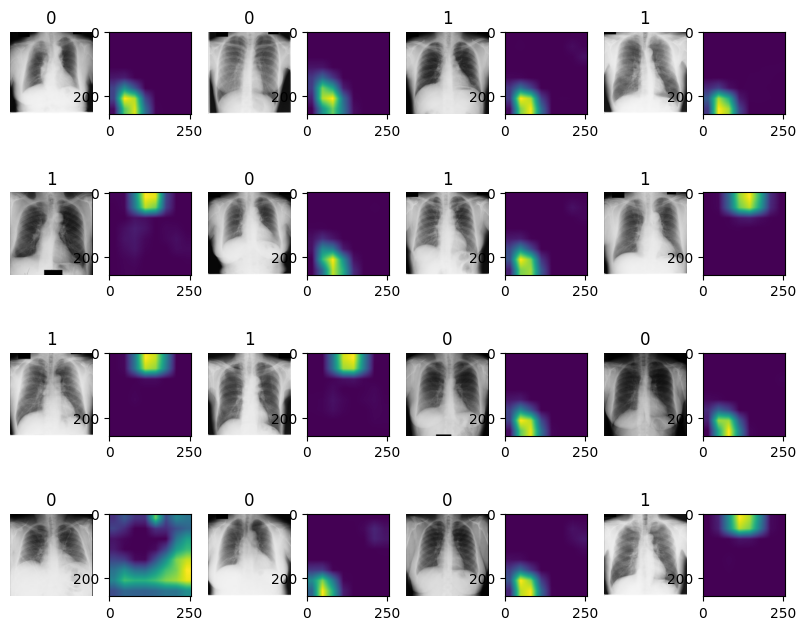

In [125]:
figure = plt.figure(figsize=(10, 8)) 
cols, rows = 8, 4
j = 0
for i in range(1, cols * rows + 1): 
    img, label = imgs[j], lbls[j]
    figure.add_subplot(rows, cols, i)
    if i%2 != 0:
        plt.title(label.item())
        plt.axis("off")
        plt.imshow(img.permute(1,2,0).cpu().detach().numpy())
    else:
        plt.imshow(grayscale_cam[j,:,:])
    if i%2 == 0:
        j = j+1
plt.show()

In [120]:
images[0][0,:,:].unsqueeze(2).shape

torch.Size([256, 256, 1])

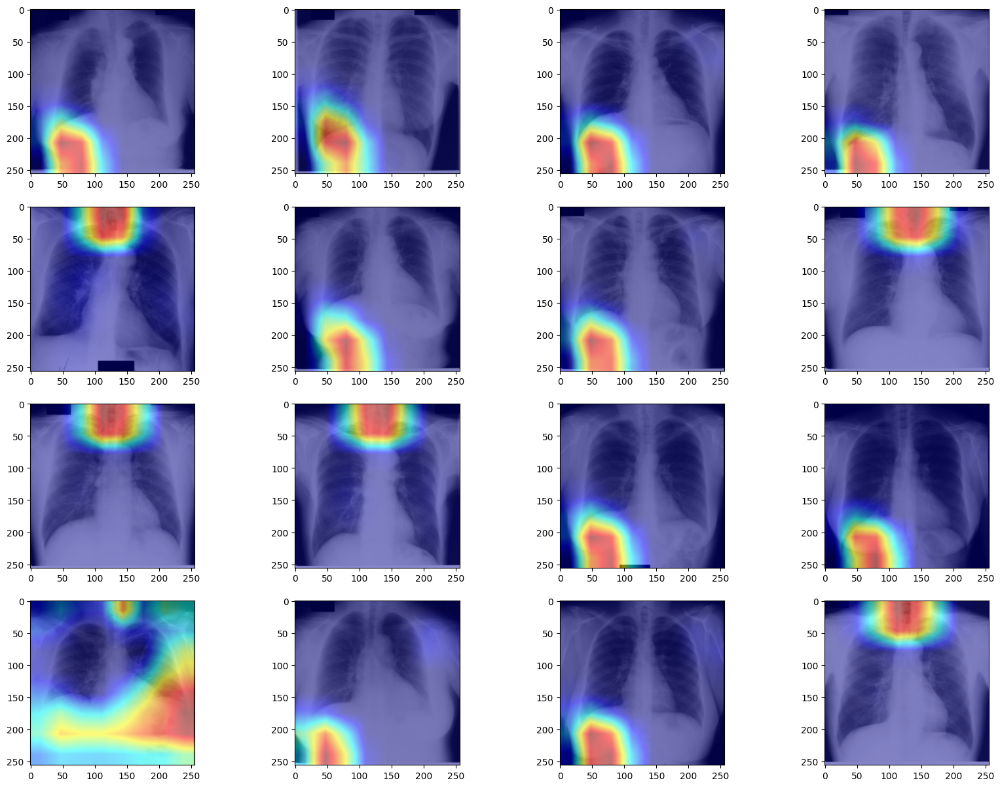

In [126]:
figure = plt.figure(figsize=(20, 15)) 
cols, rows = 4, 4
for i in range(1, cols * rows + 1): 
    image = images[i-1].permute(1,2,0).cpu().detach().numpy()
    mask = grayscale_cam[i-1,:,:]
    figure.add_subplot(rows, cols, i)
    plt.imshow(show_cam_on_image(image, mask, use_rgb=True))
plt.show()
#visualization = show_cam_on_image(images[0].permute(1,2,0).detach().numpy(), grayscale_cam[0,:,:], use_rgb=True)

### Optimizer - SGD

In [91]:
#optimizerRes = optim.Adam(resnet.parameters(), lr = 0.01) 
optimizerRes = optim.SGD(resnet.parameters(), lr=0.001, momentum=0.9)
optimizerRes

SGD (
Parameter Group 0
    dampening: 0
    lr: 0.001
    momentum: 0.9
    nesterov: False
    weight_decay: 0
)

In [92]:
num_epochs = 25

In [93]:
for images, labels in loaders['train']:
    print('images.shape:', images.shape)
    b_x = images.to(device)
    out = resnet(b_x)
    print('out.shape:', out.shape)
    print('out[0]:', out[0])
    break

images.shape: torch.Size([16, 3, 256, 256])
out.shape: torch.Size([16, 2])
out[0]: tensor([ 0.3582, -0.4342], device='cuda:0', grad_fn=<SelectBackward>)


In [94]:
history = model_fit(num_epochs, resnet, loaders, loss_func, optimizerRes)

Epoch [0], train_loss: 0.6710, train_acc: 0.6302, val_loss: 0.5540, val_acc: 0.7366
Epoch [1], train_loss: 0.5620, train_acc: 0.7435, val_loss: 0.4572, val_acc: 0.7054
Epoch [2], train_loss: 0.4589, train_acc: 0.8177, val_loss: 0.2945, val_acc: 0.9375
Epoch [3], train_loss: 0.3762, train_acc: 0.8613, val_loss: 0.2171, val_acc: 0.9688
Epoch [4], train_loss: 0.3191, train_acc: 0.8875, val_loss: 0.2077, val_acc: 0.9688
Epoch [5], train_loss: 0.2751, train_acc: 0.9062, val_loss: 0.1940, val_acc: 0.8973
Epoch [6], train_loss: 0.2422, train_acc: 0.9196, val_loss: 0.1645, val_acc: 0.9643
Epoch [7], train_loss: 0.2167, train_acc: 0.9297, val_loss: 0.1560, val_acc: 0.9286
Epoch [8], train_loss: 0.1962, train_acc: 0.9375, val_loss: 0.1553, val_acc: 0.9018
Epoch [9], train_loss: 0.1812, train_acc: 0.9430, val_loss: 0.1556, val_acc: 0.9330
Epoch [10], train_loss: 0.1660, train_acc: 0.9482, val_loss: 0.1859, val_acc: 0.8705
Epoch [11], train_loss: 0.1531, train_acc: 0.9525, val_loss: 0.1243, val_ac

In [95]:
print('Test accuracy of the images:')
evaluate(resnet, loaders['test'], loss_func)

Test accuracy of the images:


{'loss': 0.2951774001121521, 'acc': 0.9350960850715637}

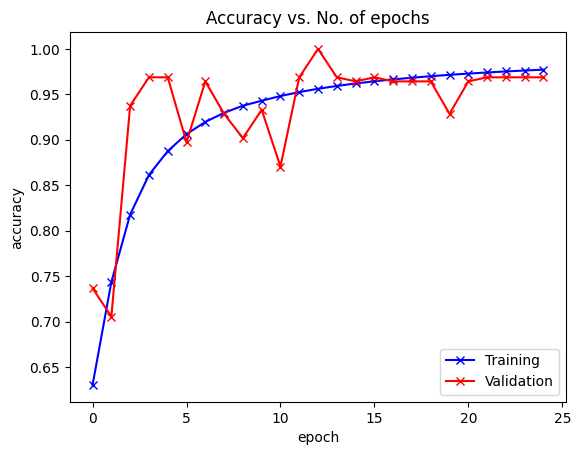

In [96]:
def plot_accuracies(history):
    """ Plot the history of accuracies"""
    train_acc = [x['train_acc'] for x in history]
    val_acc = [x['acc'] for x in history]
    plt.plot(train_acc, '-bx')
    plt.plot(val_acc, '-rx')
    plt.xlabel('epoch')
    plt.ylabel('accuracy')
    plt.legend(['Training', 'Validation'])
    plt.title('Accuracy vs. No. of epochs');
    

plot_accuracies(history)

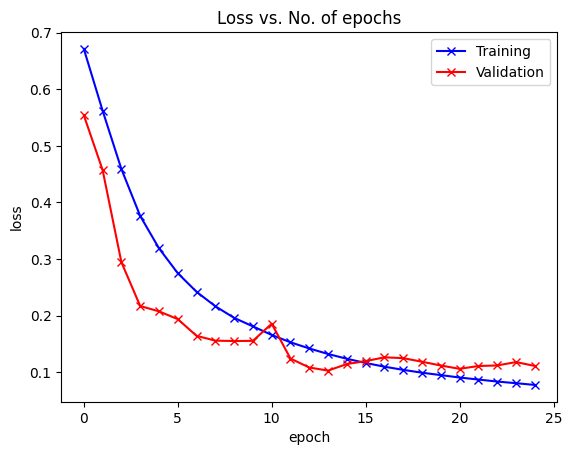

In [97]:
def plot_losses(history):
    """ Plot the losses in each epoch"""
    train_losses = [x.get('train_loss') for x in history]
    val_losses = [x['loss'] for x in history]
    plt.plot(train_losses, '-bx')
    plt.plot(val_losses, '-rx')
    plt.xlabel('epoch')
    plt.ylabel('loss')
    plt.legend(['Training', 'Validation'])
    plt.title('Loss vs. No. of epochs');

plot_losses(history)

In [98]:
sample = next(iter(loaders['test'])) 
imgs, lbls = sample

In [99]:
actual_number = lbls.numpy() 
actual_number

array([1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1])

In [100]:
imgs = imgs.to(device)
lbls = lbls.to(device)

In [101]:
test_output = resnet(imgs)
test_output = test_output.to('cpu')
pred_y = torch.max(test_output, 1)[1].data.numpy().squeeze() 
print(f'Prediction number: {pred_y}')
print(f'Actual number    : {actual_number}')

Prediction number: [1 1 0 1 1 0 0 0 1 1 1 0 0 0 0 1]
Actual number    : [1 1 0 0 1 0 1 0 1 0 1 0 0 0 1 1]


#### Explainability

In [111]:
model = resnet
target_layers = [model.resnet.layer4[-1]]

In [112]:
#images, labels = next(iter(loaders['test']))
images, labels = imgs, lbls
input_tensor = images

In [113]:
images.shape

torch.Size([16, 3, 256, 256])

In [114]:
labels

tensor([1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1], device='cuda:0')

In [115]:
# Construct the CAM object once, and then re-use it on many images:
cam = GradCAM(model=model, target_layers=target_layers, use_cuda=True)

In [116]:
# You can also use it within a with statement, to make sure it is freed,
# In case you need to re-create it inside an outer loop:
# with GradCAM(model=model, target_layers=target_layers, use_cuda=args.use_cuda) as cam:
#   ...

# We have to specify the target we want to generate
# the Class Activation Maps for.
# If targets is None, the highest scoring category
# will be used for every image in the batch.
# Here we use ClassifierOutputTarget, but you can define your own custom targets
# That are, for example, combinations of categories, or specific outputs in a non standard model.

targets = [ClassifierOutputTarget(1)]

In [117]:
# You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
grayscale_cam = cam(input_tensor=images, targets=None)

In [118]:
grayscale_cam.shape

(16, 256, 256)

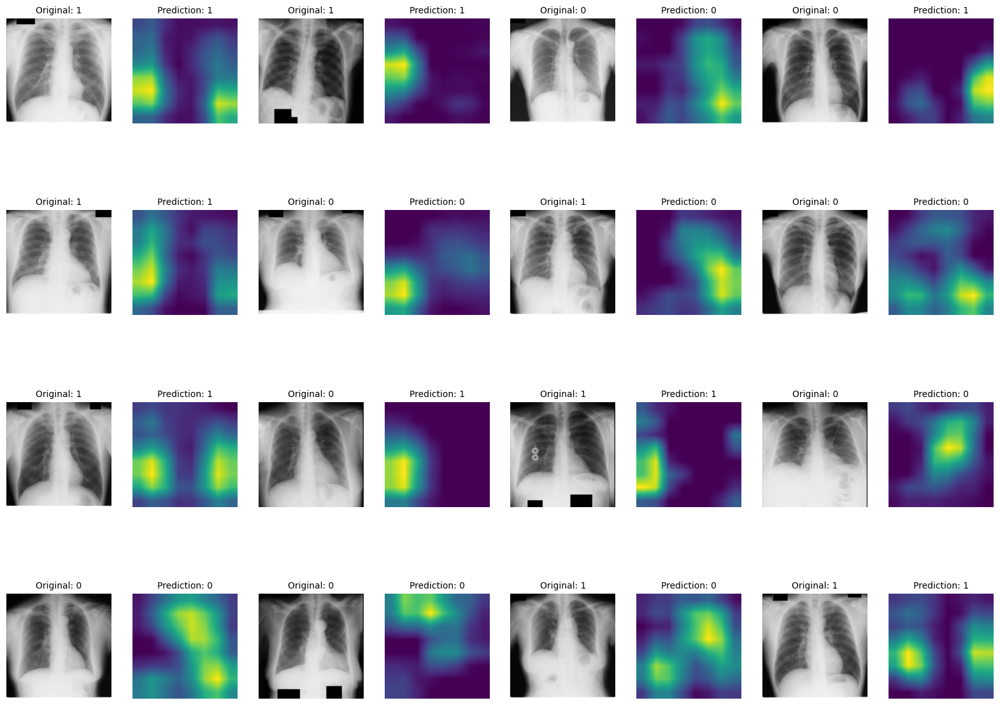

In [119]:
figure = plt.figure(figsize=(20, 15)) 
cols, rows = 8, 4
j = 0
for i in range(1, cols * rows + 1): 
    img, label, pred = images[j], labels[j], pred_y[j]
    figure.add_subplot(rows, cols, i)
    if i%2 != 0:
        plt.title(f'Original: {label.item()}',fontsize=10)
        plt.axis("off")
        plt.imshow(img.permute(1,2,0).cpu().detach().numpy())
    else:
        plt.title(f'Prediction: {pred.item()}',fontsize=10)
        plt.axis("off")
        plt.imshow(grayscale_cam[j,:,:])
    if i%2 == 0:
        j = j+1
plt.show()

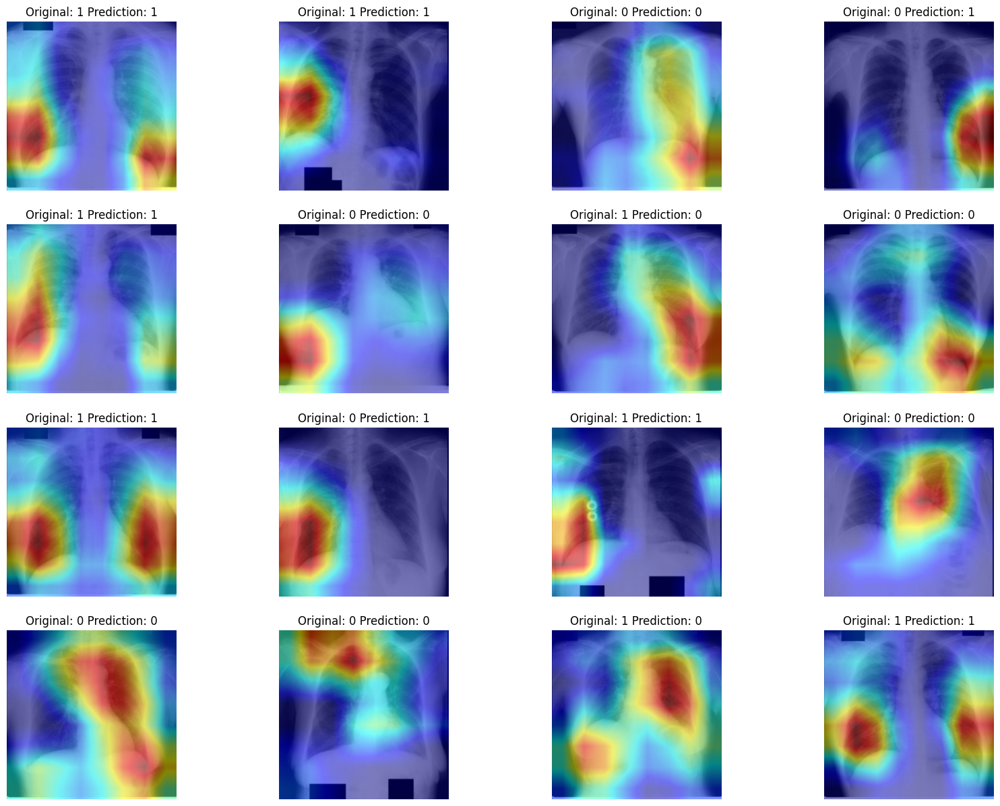

In [121]:
figure = plt.figure(figsize=(20, 15)) 
cols, rows = 4, 4
for i in range(1, cols * rows + 1): 
    image = images[i-1].permute(1,2,0).detach().to('cpu').numpy()
    label = labels[i-1]
    pred = pred_y[i-1]
    mask = grayscale_cam[i-1,:,:]
    figure.add_subplot(rows, cols, i)
    plt.title(f'Original: {label.item()} Prediction: {pred.item()}')
    plt.axis("off")
    plt.imshow(show_cam_on_image(image, mask, use_rgb=True))
plt.show()
#visualization = show_cam_on_image(images[0].permute(1,2,0).detach().numpy(), grayscale_cam[0,:,:], use_rgb=True)

In [122]:
def get_y_train(loader):
    y_train = []
    for images, labels in loader:
        y_train.extend(labels.tolist())
    return y_train

In [123]:
def get_y_test_pred(loader, model, device):
    y_test = []
    y_pred = []
    for images, labels in loader:
        output = model(images.to(device)).to('cpu')
        predictions = torch.max(output, 1)[1].data.numpy().squeeze()
        y_pred.extend(predictions.tolist())
        y_test.extend(labels.tolist())
    return y_test, y_pred

In [124]:
y_train = get_y_train(loaders['train'])
y_test, y_pred = get_y_test_pred(loaders['test'], resnet, device)

In [131]:
fpr, tpr, roc_auc = dict(), dict(), dict()
fpr["micro"], tpr["micro"], _ = roc_curve(np.array(y_test), np.array(y_pred))
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
print(f"Micro-averaged One-vs-Rest ROC AUC score:\n{roc_auc['micro']:.2f}")

Micro-averaged One-vs-Rest ROC AUC score:
0.93


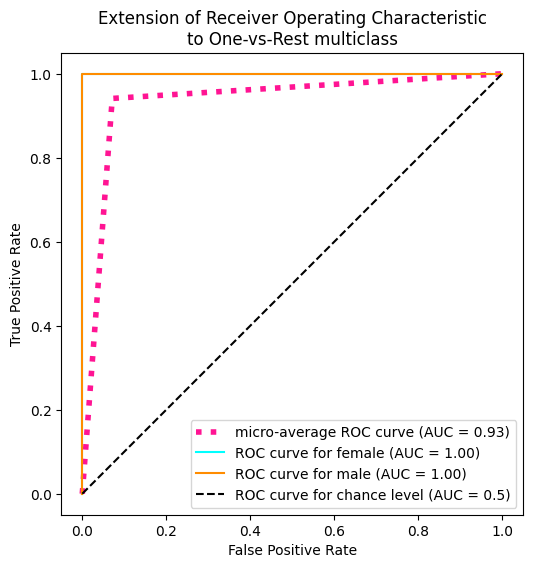

In [132]:
fig, ax = plt.subplots(figsize=(6, 6))

plt.plot(
    fpr["micro"],
    tpr["micro"],
    label=f"micro-average ROC curve (AUC = {roc_auc['micro']:.2f})",
    color="deeppink",
    linestyle=":",
    linewidth=4,
)

colors = cycle(["aqua", "darkorange", "cornflowerblue"])
for class_id, color in zip(range(num_classes), colors):
    RocCurveDisplay.from_predictions(
        y_onehot_test[:, class_id],
        y_onehot_pred[:, class_id],
        name=f"ROC curve for {class_names[class_id]}",
        color=color,
        ax=ax,
    )

plt.plot([0, 1], [0, 1], "k--", label="ROC curve for chance level (AUC = 0.5)")
plt.axis("square")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Extension of Receiver Operating Characteristic\nto One-vs-Rest multiclass")
plt.legend()
plt.show()

# Task 4 - Age Regression using ResNet18

In [133]:
def preprocess(image, input_size, augmentation=True):
    if augmentation:
        aug_transform = transforms.Compose([
            transforms.ToPILImage(),
            transforms.Resize((input_size, input_size)),
            transforms.RandomRotation((0,180)),
            transforms.ToTensor(),
        ])
    else:
        aug_transform = transforms.Compose([
            transforms.ToPILImage(),
            transforms.Resize((input_size, input_size)),
            transforms.ToTensor(),
        ])

    result = aug_transform(image)
    return result

In [134]:
class AgeDataset(Dataset):
    def __init__(self, data_root, file_path, input_size, augment):
        #self.data = []
        self.data_root = data_root
        self.input_size = input_size
        self.augment = augment

        self.data = pd.read_csv(file_path)

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        image = cv2.imread(os.path.join(self.data_root, self.data.loc[idx,'filenames']))
        image = preprocess(image, self.input_size, self.augment)
        age = float(self.data.loc[idx,'age'])
        return image, age


In [135]:
train_path = 'XPAge01_RGB/XP/trainingdata.csv'
test_path = 'XPAge01_RGB/XP/testdata.csv'
#test_path = 'XPAge01_RGB/XP/trainingdata.csv'
#train_path = 'XPAge01_RGB/XP/testdata.csv'

In [136]:
data_root = 'XPAge01_RGB/XP/JPGs/'
input_size = 512
augment = False

In [137]:
train_data = AgeDataset(data_root, train_path, input_size, augment)
test_data = AgeDataset(data_root, test_path, input_size, augment)

In [138]:
print(train_data)
print(test_data)

In [139]:
print(train_data.__len__())
print(test_data.__len__())

80
165


In [140]:
num_classes = 1

In [141]:
img, label = train_data.__getitem__(22)
print(img.shape, label)

torch.Size([3, 512, 512]) 52.0


In [142]:
img, label = test_data[22]
print(img.shape, label)

torch.Size([3, 512, 512]) 47.0


In [143]:
print(f"Images in train data : {len(train_data)}")
print(f"Images in test data : {len(test_data)}")

Images in train data : 80
Images in test data : 165


In [144]:
def display_img(img,label):
    print(f"Label : {label}")
    plt.imshow(img.permute(1,2,0))

54
Label : 39.0


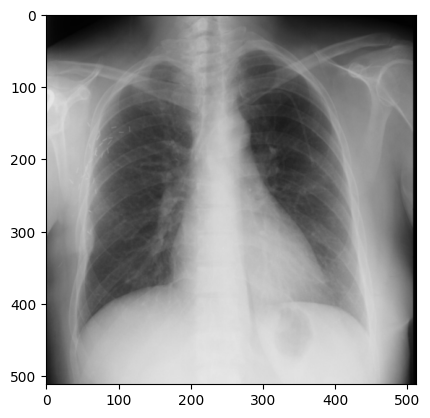

In [147]:
idx = random.randint(0,len(train_data))
print(idx)
display_img(*train_data[idx])

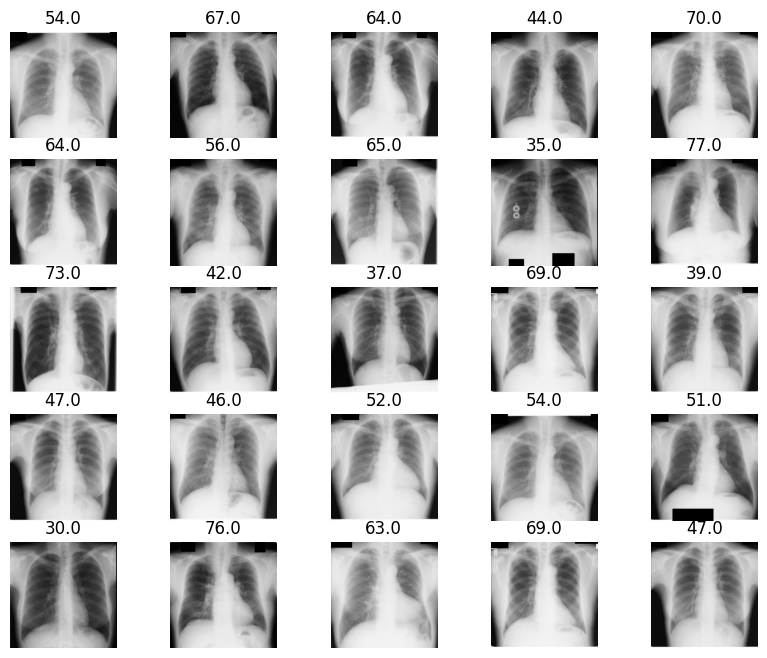

In [148]:
figure = plt.figure(figsize=(10, 8)) 
cols, rows = 5, 5
for i in range(1, cols * rows + 1):
  sample_idx = torch.randint(len(train_data), size=(1,)).item() 
  img, label = train_data[sample_idx]
  figure.add_subplot(rows, cols, i)
  plt.title(label)
  plt.axis("off")
  plt.imshow(img.permute(1,2,0))#.type(torch.ByteTensor))
plt.show()

In [149]:
random_seed = 165
torch.manual_seed(random_seed)

In [150]:
val_size = int(0.2 * len(train_data))
print(val_size)
train_size = len(train_data) - val_size
print(train_size)

16
64


In [151]:
train_set, val_set = random_split(train_data,[train_size,val_size])
print(f"Length of Train Data : {len(train_set)}")
print(f"Length of Validation Data : {len(val_set)}")

Length of Train Data : 64
Length of Validation Data : 16


In [152]:
batch = 16

In [153]:
loaders = {'train': DataLoader(train_set, batch_size=batch, shuffle=True, num_workers=1),
           'val': DataLoader(val_set, batch_size=batch, shuffle=True, num_workers=1),
           'test' : DataLoader(test_data, batch_size=batch, shuffle=True, num_workers=1)}
loaders

{'train': <torch.utils.data.dataloader.DataLoader at 0x2b60e1215890>,
 'val': <torch.utils.data.dataloader.DataLoader at 0x2b60e3628f10>,
 'test': <torch.utils.data.dataloader.DataLoader at 0x2b60e36280d0>}

In [154]:
from torchvision.utils import make_grid

def show_batch(dl):
    for images, labels in dl:
        fig,ax = plt.subplots(figsize = (8,12))
        ax.set_xticks([])
        ax.set_yticks([])
        ax.imshow(make_grid(images,nrow=8).permute(1,2,0))
        break

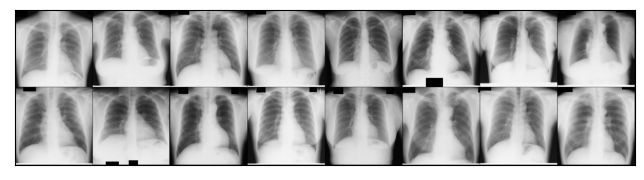

In [155]:
show_batch(loaders['train'])

#### Base Model

In [156]:
class Base(nn.Module):
    def training_step(self, batch, loss_func):
        images, labels = batch
        images = images.to(device).float()
        labels = labels.to(device).float()
        output = self(images)
        train_loss = loss_func(output, labels)
        train_acc = accuracy(output, labels)
        return {'train_loss': train_loss, 'train_acc': train_acc}
    
    def validation_step(self, batch, loss_func):
        images, labels = batch
        images = images.to(device).float()
        labels = labels.to(device).float()
        output = self(images)
        val_loss = loss_func(output, labels)
        val_acc = accuracy(output, labels)
        return {'val_loss': val_loss.detach(), 'val_acc': val_acc}

    def validation_epoch_end(self, outputs):
        batch_loss = [x['val_loss'] for x in outputs]
        epoch_loss = torch.stack(batch_loss).mean()
        batch_acc = [x['val_acc'] for x in outputs]
        epoch_acc = torch.stack(batch_acc).mean()
        return {'loss': epoch_loss.item(), 'acc': epoch_acc.item()}

    def epoch_end(self, epoch, result):
        print("Epoch [{}], train_loss: {:.4f}, train_error: {:.4f}, val_loss: {:.4f}, val_error: {:.4f}".format(
                epoch, result['train_loss'], result['train_acc'], result['loss'], result['acc']))

In [160]:
num_epochs = 200

In [161]:
loss_func = nn.L1Loss() 
loss_func

L1Loss()

In [164]:
def accuracy(outputs, labels):
    #_, preds = torch.max(outputs, 1)
    preds = outputs
    #print('outputs:')
    #print(outputs)
    #print('labels:')
    #print(labels)
    return torch.tensor(torch.abs(preds - labels).sum().item()/ len(preds))

In [165]:
def evaluate(model, val_loader, loss_func):
    model.eval()
    outputs = [model.validation_step(batch, loss_func) for batch in val_loader]
    return model.validation_epoch_end(outputs)

In [166]:
def model_fit(num_epochs, model, loaders, loss_func, optimizer):
    history = []
    train_batch_loss = []
    train_batch_acc = []
    
    for epoch in range(num_epochs):
        model.train()
        for batch in loaders['train']:
            train_step_res = model.training_step(batch, loss_func)
            train_step_loss = train_step_res['train_loss']
            train_batch_loss.append(train_step_loss)
            train_batch_acc.append(train_step_res['train_acc'])
            # clear gradients for this training step
            optimizer.zero_grad()
            # backpropagation, compute gradients
            train_step_loss.backward()
            # apply gradients
            optimizer.step()
        #scheduler.step()
        result = evaluate(model, loaders['val'], loss_func)
        scheduler.step()
        result['train_loss'] = torch.stack(train_batch_loss).mean().item()
        result['train_acc'] = torch.stack(train_batch_acc).mean().item()
        model.epoch_end(epoch, result)
        history.append(result)
    return history

#### Training

In [157]:
class ResNet18(Base):
    def __init__(self):
        super(ResNet18, self).__init__()

        resnet18 = models.resnet18(pretrained=True) #(weights=None)
        #count = 0
        #for child in resnet18.children():
        #    count+=1
        #    if count < 7:
        #        for param in child.parameters():
        #            param.requires_grad = False
        resnet18.fc = nn.Sequential(
            nn.Linear(resnet18.fc.in_features, 256),
            nn.Linear(256, num_classes)
        )#nn.Linear(resnet18.fc.in_features, 1)
        
        self.resnet = resnet18
    
    def forward(self, x):
        x = self.resnet.conv1(x)
        x = self.resnet.bn1(x)
        x = self.resnet.relu(x)
        x = self.resnet.maxpool(x)
        x = self.resnet.layer1(x)
        x = self.resnet.layer2(x)
        x = self.resnet.layer3(x)
        x = self.resnet.layer4(x)
        x = self.resnet.avgpool(x)
        #print('pre_fin_layer:')
        #print(x)
        x = x.view(x.size(0), -1)
        #print('pre_fin_layer_reshaped:')
        #print(x)
        output = self.resnet.fc(x)
        #print('model output:')
        #print(output)
        
        return output

In [158]:
model = models.resnet18(pretrained=True)
count = 0
for child in model.children():
    count+=1
print(count)

10


In [159]:
resnet = ResNet18()
resnet = resnet.to(device)

In [162]:
optimizerRes = optim.Adam(resnet.parameters(), lr = 0.01) 
scheduler = optim.lr_scheduler.StepLR(optimizerRes, step_size=50, gamma=0.1)
#scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizerRes, 'min', patience = 2, threshold = 0.01)
#scheduler = optim.lr_scheduler.CyclicLR(optimizerRes, base_lr=0.01, max_lr=0.1, cycle_momentum=False)
#scheduler = optim.lr_scheduler.OneCycleLR(optimizerRes, max_lr=0.9, steps_per_epoch=len(loaders['train']), epochs=num_epochs)
optimizerRes

Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    initial_lr: 0.01
    lr: 0.01
    weight_decay: 0
)

In [163]:
for images, labels in loaders['train']:
    print('images.shape:', images.shape)
    b_x = images.to(device)
    out = resnet(b_x)
    print('out.shape:', out.shape)
    print('out[0]:', out[0])
    break

images.shape: torch.Size([16, 3, 512, 512])
out.shape: torch.Size([16, 1])
out[0]: tensor([-0.0856], device='cuda:0', grad_fn=<SelectBackward>)


In [167]:
history = model_fit(num_epochs, resnet, loaders, loss_func, optimizerRes)

/home/msarava7/.conda/envs/swin_v2_c11/lib/python3.7/site-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([16])) that is different to the input size (torch.Size([16, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


Epoch [0], train_loss: 37.1254, train_error: 594.0071, val_loss: 17722522.0000, val_error: 283560352.0000
Epoch [1], train_loss: 24.8636, train_error: 397.8178, val_loss: 5615798.0000, val_error: 89852768.0000
Epoch [2], train_loss: 20.6499, train_error: 330.3977, val_loss: 132174.5000, val_error: 2114792.0000
Epoch [3], train_loss: 18.5224, train_error: 296.3580, val_loss: 51055.3125, val_error: 816885.0000
Epoch [4], train_loss: 17.4600, train_error: 279.3604, val_loss: 13509.1191, val_error: 216145.9062
Epoch [5], train_loss: 16.5673, train_error: 265.0765, val_loss: 3039.4341, val_error: 48630.9453
Epoch [6], train_loss: 15.8678, train_error: 253.8855, val_loss: 775.5729, val_error: 12409.1660
Epoch [7], train_loss: 15.4984, train_error: 247.9737, val_loss: 225.9759, val_error: 3615.6143
Epoch [8], train_loss: 15.2192, train_error: 243.5065, val_loss: 87.9431, val_error: 1407.0900
Epoch [9], train_loss: 15.0526, train_error: 240.8421, val_loss: 40.2760, val_error: 644.4158
Epoch [1

In [168]:
torch.cuda.empty_cache()

#### Testing

In [169]:
print('Test accuracy of the images:')
evaluate(resnet, loaders['test'], loss_func)

Test accuracy of the images:


/home/msarava7/.conda/envs/swin_v2_c11/lib/python3.7/site-packages/torch/nn/modules/loss.py:96: UserWarning: Using a target size (torch.Size([5])) that is different to the input size (torch.Size([5, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)


{'loss': 11.869035720825195, 'acc': 172.8485870361328}

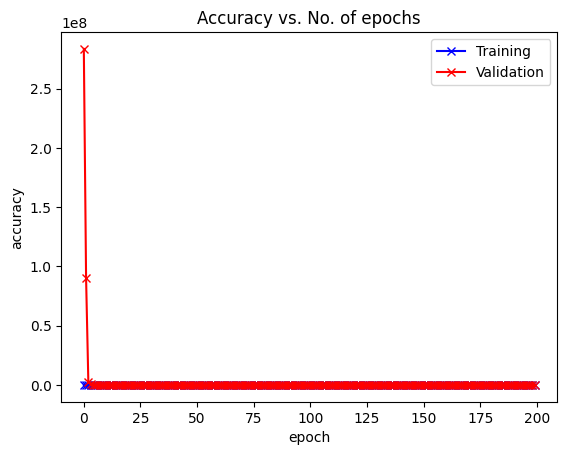

In [170]:
def plot_accuracies(history):
    """ Plot the history of accuracies"""
    train_acc = [x['train_acc'] for x in history]
    val_acc = [x['acc'] for x in history]
    plt.plot(train_acc, '-bx')
    plt.plot(val_acc, '-rx')
    plt.xlabel('epoch')
    plt.ylabel('accuracy')
    plt.legend(['Training', 'Validation'])
    plt.title('Accuracy vs. No. of epochs');
    

plot_accuracies(history)

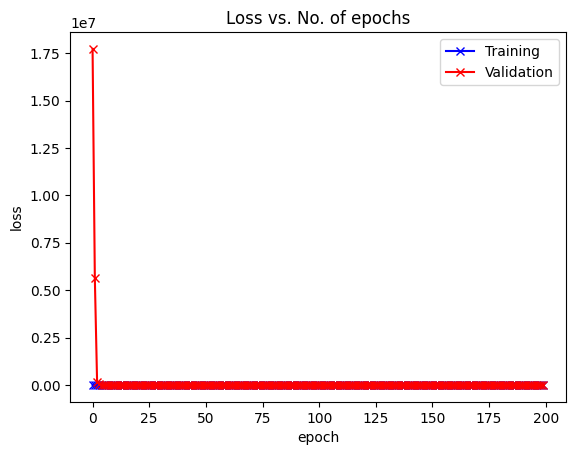

In [171]:
def plot_losses(history):
    """ Plot the losses in each epoch"""
    train_losses = [x.get('train_loss') for x in history]
    val_losses = [x['loss'] for x in history]
    plt.plot(train_losses, '-bx')
    plt.plot(val_losses, '-rx')
    plt.xlabel('epoch')
    plt.ylabel('loss')
    plt.legend(['Training', 'Validation'])
    plt.title('Loss vs. No. of epochs');

plot_losses(history)

In [172]:
sample = next(iter(loaders['test'])) 
imgs, lbls = sample

In [173]:
actual_number = lbls.numpy() 
actual_number

array([16., 59., 53., 60., 76., 66., 69., 50., 53., 64., 78., 47., 49.,
       83., 50., 54.])

In [174]:
imgs = imgs.to(device)
lbls = lbls.to(device)

In [175]:
test_output = resnet(imgs)
test_output = test_output.to('cpu')
pred_y = test_output.data.numpy().squeeze() 
print(f'Prediction number: {pred_y}')
print(f'Actual number    : {actual_number}')

Prediction number: [55.453537 55.422905 55.346077 55.58962  55.52231  55.70472  55.398212
 55.403748 55.524765 55.432365 56.54966  56.550102 54.186363 55.551586
 55.439583 55.56896 ]
Actual number    : [16. 59. 53. 60. 76. 66. 69. 50. 53. 64. 78. 47. 49. 83. 50. 54.]


In [180]:
torch.save(resnet, '/home/msarava7/WarmUpExer/XPAge01_RGB/age_reg_original.pth')

#### Explainability

In [176]:
model = resnet
target_layers = [model.resnet.layer4[-1]]

In [177]:
#images, labels = next(iter(loaders['test']))
images, labels = imgs, lbls
input_tensor = images

In [178]:
labels

tensor([16., 59., 53., 60., 76., 66., 69., 50., 53., 64., 78., 47., 49., 83.,
        50., 54.], device='cuda:0', dtype=torch.float64)

In [179]:
# Construct the CAM object once, and then re-use it on many images:
cam = GradCAM(model=model, target_layers=target_layers, use_cuda=True)

In [183]:
# You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
grayscale_cam = cam(input_tensor=images, targets=None)

In [184]:
grayscale_cam.shape

(16, 512, 512)

In [185]:
images.shape

torch.Size([16, 3, 512, 512])

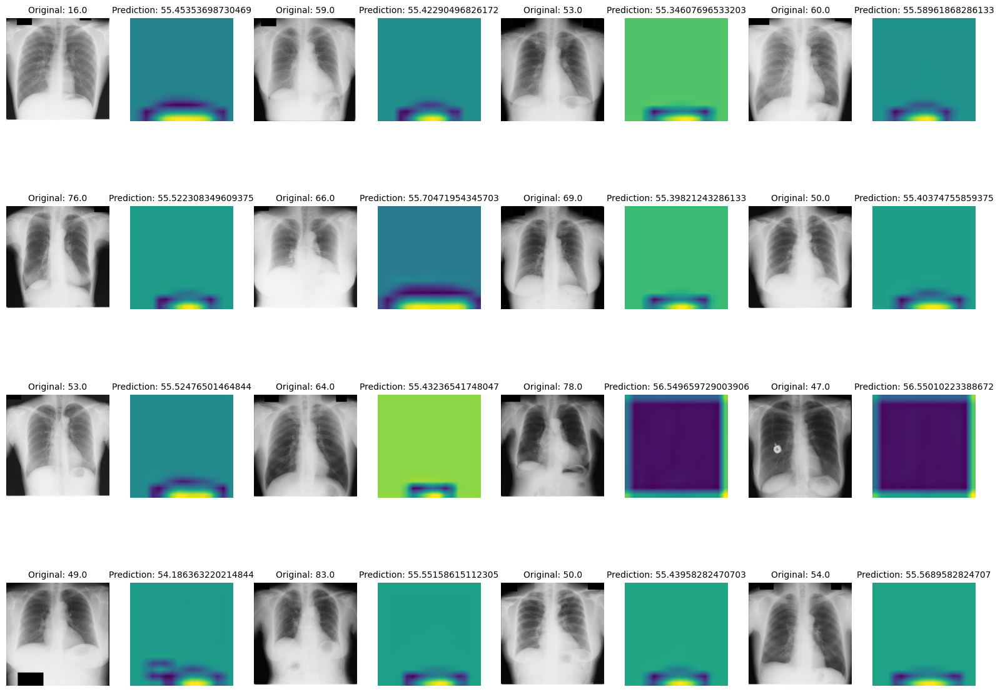

In [186]:
figure = plt.figure(figsize=(20, 15)) 
cols, rows = 8, 4
j = 0
for i in range(1, cols * rows + 1): 
    img, label, pred = images[j], labels[j], pred_y[j]
    figure.add_subplot(rows, cols, i)
    if i%2 != 0:
        plt.title(f'Original: {label.item()}',fontsize=10)
        plt.axis("off")
        plt.imshow(img.permute(1,2,0).cpu().detach().numpy())
    else:
        plt.title(f'Prediction: {pred.item()}',fontsize=10)
        plt.axis("off")
        plt.imshow(grayscale_cam[j,:,:])
    if i%2 == 0:
        j = j+1
plt.show()

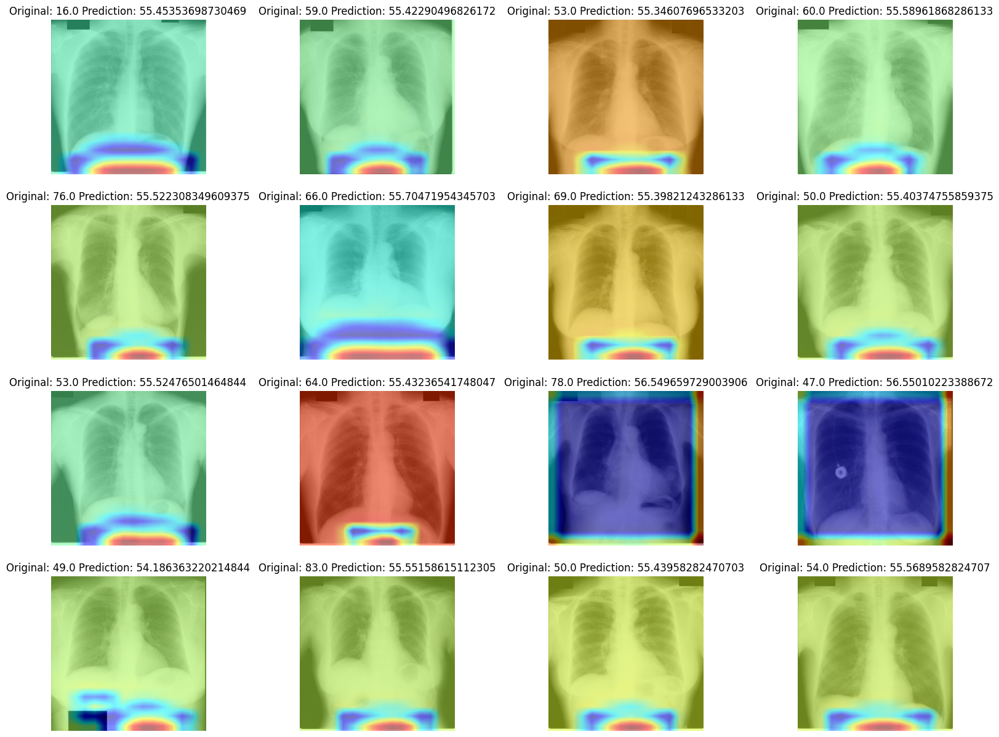

In [187]:
figure = plt.figure(figsize=(20, 15)) 
cols, rows = 4, 4
for i in range(1, cols * rows + 1): 
    image = images[i-1].permute(1,2,0).detach().to('cpu').numpy()
    label = labels[i-1]
    pred = pred_y[i-1]
    mask = grayscale_cam[i-1,:,:]
    figure.add_subplot(rows, cols, i)
    plt.title(f'Original: {label.item()} Prediction: {pred.item()}')
    plt.axis("off")
    plt.imshow(show_cam_on_image(image, mask, use_rgb=True))
plt.show()
#visualization = show_cam_on_image(images[0].permute(1,2,0).detach().numpy(), grayscale_cam[0,:,:], use_rgb=True)

# Task 5 - Semantic Segmentation

In [5]:
def preprocess(image, input_size, augmentation=True):
    if augmentation:
        aug_transform = transforms.Compose([
            transforms.ToPILImage(),
            transforms.Resize((input_size, input_size)),
            transforms.RandomHorizontalFlip(p=0.5),
            transforms.RandomRotation((0,180)),
            transforms.ToTensor(),
        ])
    else:
        aug_transform = transforms.Compose([
            transforms.ToPILImage(),
            transforms.Resize((input_size, input_size)),
            transforms.ToTensor(),
        ])

    result = aug_transform(image)
    return result

In [6]:
class DatasetLoader(Dataset):
    def __init__(self, data_root, input_size, augment):
        self.input_size = input_size
        self.augment = augment
        self.data_root = data_root
        for directory, _,files in os.walk(os.path.join(self.data_root, 'org')):
            self.image_data = pd.DataFrame(files, index = np.arange(0, len(files)), columns = ['image_name'])
            break

    def __len__(self):
        return len(self.image_data)

    def __getitem__(self, idx):
        image = cv2.imread(os.path.join(self.data_root, 'org', self.image_data.loc[idx,:].image_name))
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = preprocess(image, self.input_size, self.augment)
        mask = cv2.imread(os.path.join(self.data_root, 'label', self.image_data.loc[idx,:].image_name), cv2.IMREAD_GRAYSCALE)
        mask = preprocess(mask, self.input_size, self.augment)
        return image, mask


In [7]:
train_path = '/home/msarava7/WarmUpExer/Segmentation01/train'
test_path = '/home/msarava7/WarmUpExer/Segmentation01/test'

In [8]:
input_size = 256
augment = False

In [9]:
train_val = DatasetLoader(train_path, input_size, augment)
test_data = DatasetLoader(test_path, input_size, augment)

In [10]:
data_list = {'train':train_val, 'test':test_data}

In [11]:
for key in data_list:
  print(key,':',data_list[key].__len__())

train : 50
test : 10


In [12]:
img, mask = train_val.__getitem__(22)
print(img.shape, mask.shape)

torch.Size([3, 256, 256]) torch.Size([1, 256, 256])


In [13]:
def display_img(img,mask):
    figure = plt.figure(figsize=(10, 5))
    figure.add_subplot(1, 2, 1)
    plt.title('Original')
    plt.imshow(img.permute(1,2,0))
    figure.add_subplot(1, 2, 2)
    plt.title('Mask')
    plt.imshow(mask.permute(1,2,0))

21


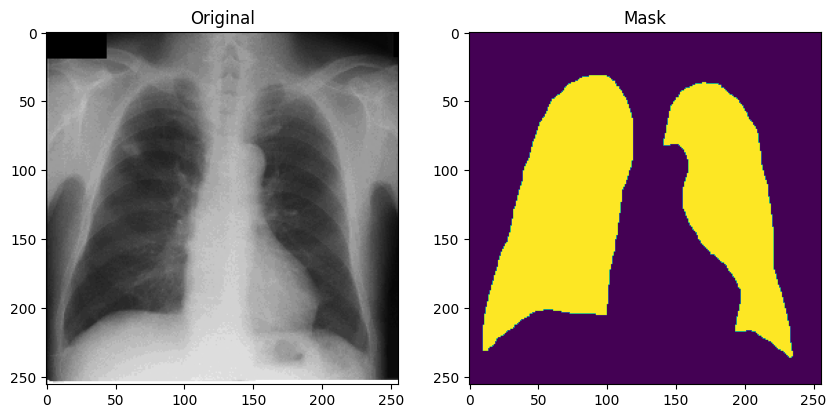

In [14]:
idx = random.randint(0,len(train_val))
print(idx)
display_img(*train_val[idx])

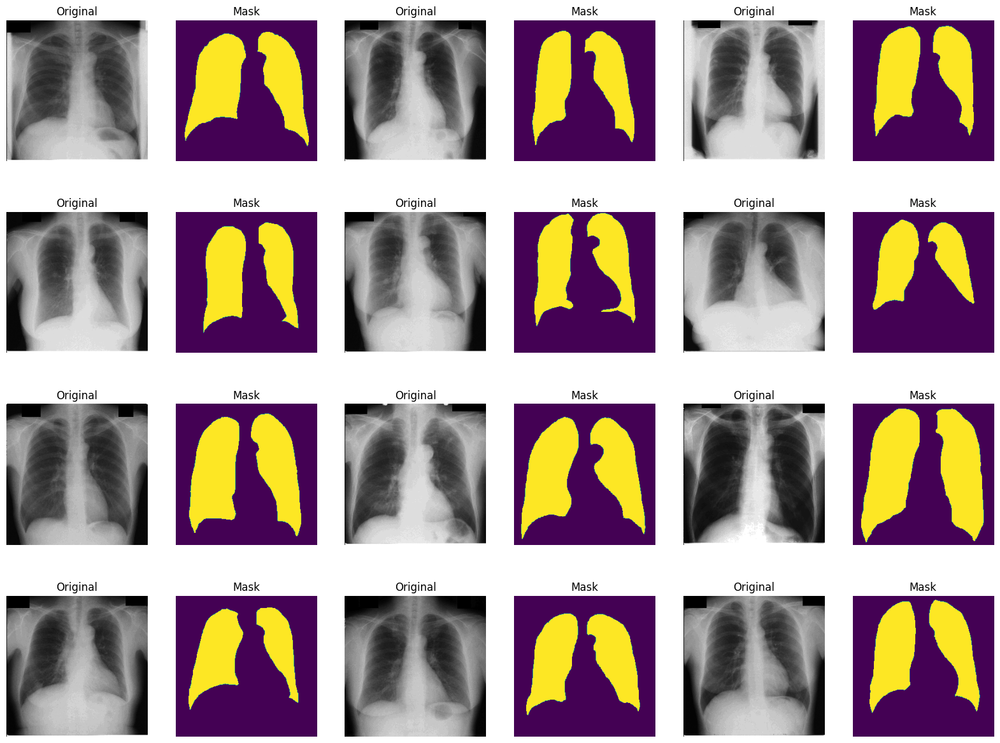

In [15]:
figure = plt.figure(figsize=(20, 15)) 
cols, rows = 6, 4
for i in range(1, cols * rows + 1, 2):
    sample_idx = torch.randint(len(train_val), size=(1,)).item() 
    img, mask = train_val[sample_idx]
    figure.add_subplot(rows, cols, i)
    plt.title('Original')
    plt.axis("off")
    plt.imshow(img.permute(1,2,0))
    figure.add_subplot(rows, cols, i+1)
    plt.title('Mask')
    plt.axis("off")
    plt.imshow(mask.permute(1,2,0))#.type(torch.ByteTensor))
plt.show()

In [16]:
random_seed = 267
torch.manual_seed(random_seed)

In [17]:
val_size = int(0.2 * len(train_val))
print(val_size)
train_size = len(train_val) - val_size
print(train_size)

10
40


In [18]:
train_data, val_data = random_split(train_val,[train_size,val_size])
print(f"Length of Train Data : {len(train_data)}")
print(f"Length of Validation Data : {len(val_data)}")

Length of Train Data : 40
Length of Validation Data : 10


In [19]:
batch = 16

In [20]:
loaders = {'train': DataLoader(train_data, batch_size=batch, shuffle=True, num_workers=1),
           'val': DataLoader(val_data, batch_size=batch, shuffle=True, num_workers=1),
           'test' : DataLoader(test_data, batch_size=batch, shuffle=True, num_workers=1)}
loaders

{'train': <torch.utils.data.dataloader.DataLoader at 0x2abdb9b0bc90>,
 'val': <torch.utils.data.dataloader.DataLoader at 0x2abdb9b0ba90>,
 'test': <torch.utils.data.dataloader.DataLoader at 0x2abdb9b0bc50>}

## Base Model

In [21]:
class Base(nn.Module):
    def training_step(self, batch, loss_func):
        images, labels = batch
        images = images.to(device).float()
        labels = labels.to(device)
        output = self(images)
        train_loss = loss_func(output.float().clone(), labels.float().clone())
        train_iou = iou(output, labels)
        del images, labels, output
        return {'train_loss': train_loss, 'train_iou': train_iou}
    
    def validation_step(self, batch, loss_func):
        images, labels = batch
        images = images.to(device).float()
        labels = labels.to(device)
        output = self(images)
        val_loss = loss_func(output.float().clone(), labels.float().clone())
        val_iou = iou(output, labels)
        del images, labels, output
        return {'val_loss': val_loss.detach(), 'val_iou': val_iou}

    def validation_epoch_end(self, outputs):
        batch_loss = [x['val_loss'] for x in outputs]
        epoch_loss = torch.stack(batch_loss).mean()
        batch_iou = [x['val_iou'] for x in outputs]
        epoch_iou = torch.stack(batch_iou).mean()
        return {'loss': epoch_loss.item(), 'iou': epoch_iou.item()}

    def epoch_end(self, epoch, result):
        print("Epoch [{}], train_loss: {:.4f}, train_iou: {:.4f}, val_loss: {:.4f}, val_iou: {:.4f}".format(
                epoch, result['train_loss'], result['train_iou'], result['loss'], result['iou']))


In [22]:
def multilabelaccuracy(outputs, labels):
    preds = torch.sigmoid(outputs)
    preds[preds >= 0.5] = 1
    preds[preds < 0.5] = 0
    metric = MultilabelAccuracy(num_labels=labels.shape[1]).to(device)
    acc = metric(preds, labels)
    del outputs, labels, preds
    return acc

In [23]:
class BCEDiceLoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(BCEDiceLoss, self).__init__()

    def forward(self, outputs, labels, smooth=1):
        
        #comment out if your model contains a sigmoid or equivalent activation layer
        outputs = torch.sigmoid(outputs)       
        
        #flatten label and prediction tensors
        outputs = outputs.view(-1)
        labels = labels.view(-1)
        
        intersection = (outputs * labels).sum()                            
        dice_loss = 1 - (2.*intersection + smooth)/(outputs.sum() + labels.sum() - intersection + smooth)  
        BCE = nn.functional.binary_cross_entropy(outputs, labels, reduction='mean')
        BCE_Dice = BCE + dice_loss
        
        return BCE_Dice

In [24]:
def iou(outputs, labels, smooth = 1e-6):
    # You can comment out this line if you are passing tensors of equal shape
    # But if you are passing output from UNet or something it will most probably
    # be with the BATCH x 1 x H x W shape
    #outputs = outputs.squeeze(1)  # BATCH x 1 x H x W => BATCH x H x W
    
    outputs = torch.sigmoid(outputs)
    intersection = (outputs * labels).sum() #(outputs.detach() & labels).sum((1, 2))
    union = outputs.sum() + labels.sum() - intersection #(outputs.detach() | labels).sum((1, 2))
    
    iou = (intersection + smooth) / (union + smooth)  # We smooth our devision to avoid 0/0
    
    thresholded = torch.clamp(20 * (iou - 0.5), 0, 10).ceil() / 10  # This is equal to comparing with thresolds
    
    return thresholded 

In [25]:
def auc_roc(outputs, labels, list_flag):
    if list_flag==0:
      preds = torch.sigmoid(outputs)
      preds = preds.to('cpu').detach()
      labels = labels.to('cpu').detach()
    else:
      preds = outputs
      #print(len(preds))
      #print(len(labels))
      preds = preds#[0]
      labels = labels#[0]
    #print('auc')
    #print(labels)
    #print(preds)
    auc = roc_auc_score(labels, preds, average='micro', multi_class='ovr')
    del outputs, labels, preds
    return auc

In [26]:
def evaluate(model, val_loader, loss_func):
    model.eval()
    outputs = [model.validation_step(batch, loss_func) for batch in val_loader]#tqdm(val_loader)]
    return model.validation_epoch_end(outputs)

In [27]:
def model_fit(num_epochs, model, loaders, loss_func, optimizer, scheduler):
    history = []
    train_batch_loss = []
    train_batch_iou = []
    torch.autograd.set_detect_anomaly(True)
    
    for epoch in range(num_epochs):
        model.train()
        for batch in loaders['train']:#tqdm(loaders['train']):
            train_step_res = model.training_step(batch, loss_func)
            train_step_loss = train_step_res['train_loss']
            train_batch_loss.append(train_step_loss)
            train_batch_iou.append(train_step_res['train_iou'])
            # clear gradients for this training step
            optimizer.zero_grad()
            # backpropagation, compute gradients
            train_step_loss.backward()
            # apply gradients
            optimizer.step()
        #scheduler.step()
        result = evaluate(model, loaders['val'], loss_func)
        #scheduler.step()
        result['train_loss'] = torch.stack(train_batch_loss).mean().item()
        result['train_iou'] = torch.stack(train_batch_iou).mean().item()
        model.epoch_end(epoch, result)
        history.append(result)
    return history

In [28]:
num_epochs = 60
loss_func = BCEDiceLoss()
print(loss_func)

BCEDiceLoss()


In [29]:
def plot_iou(history):
    """ Plot the history of iou"""
    train_iou = [x['train_iou'] for x in history]
    val_iou = [x['iou'] for x in history]
    plt.plot(train_iou, '-bx')
    plt.plot(val_iou, '-rx')
    plt.xlabel('epoch')
    plt.ylabel('IOU')
    plt.legend(['Training', 'Validation'])
    plt.title('IOU vs. No. of epochs')

In [30]:
def plot_losses(history):
    """ Plot the losses in each epoch"""
    train_losses = [x.get('train_loss') for x in history]
    val_losses = [x['loss'] for x in history]
    plt.plot(train_losses, '-bx')
    plt.plot(val_losses, '-rx')
    plt.xlabel('epoch')
    plt.ylabel('loss')
    plt.legend(['Training', 'Validation'])
    plt.title('Loss vs. No. of epochs');

## UNet

##### UNet Training

In [31]:
class Unet(Base):
    def __init__(self):
        super(Unet, self).__init__()

        unet = smp.model = smp.Unet('resnet18', encoder_weights='imagenet', classes=1, 
                                    activation=None, encoder_depth=3, decoder_channels=[64, 32, 16])
        
        self.unet = unet
    
    def forward(self, x):
        output = self.unet(x)
        return output

In [32]:
unet = Unet()
unet = unet.to(device)
unet

Unet(
  (unet): Unet(
    (encoder): ResNetEncoder(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): BasicBlock(
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu): ReLU(inplace=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
        (1): BasicBlock(
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn1): BatchNorm2d

In [33]:
optimizerUnet = optim.Adam(unet.parameters(), lr = 0.001) 
schedulerUnet = optim.lr_scheduler.StepLR(optimizerUnet, step_size=30, gamma=0.1)
print(optimizerUnet)

Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    initial_lr: 0.001
    lr: 0.001
    weight_decay: 0
)


In [34]:
history_unet = model_fit(num_epochs, unet, loaders, loss_func, optimizerUnet, schedulerUnet)

Epoch [0], train_loss: 1.1330, train_iou: 0.0000, val_loss: 1.1542, val_iou: 0.0000
Epoch [1], train_loss: 0.8208, train_iou: 0.0000, val_loss: 0.8623, val_iou: 0.0000
Epoch [2], train_loss: 0.6301, train_iou: 0.0333, val_loss: 0.4712, val_iou: 0.0000
Epoch [3], train_loss: 0.5031, train_iou: 0.0667, val_loss: 0.2460, val_iou: 0.1000
Epoch [4], train_loss: 0.3988, train_iou: 0.1133, val_loss: 0.1903, val_iou: 0.2000
Epoch [5], train_loss: 0.3087, train_iou: 0.1611, val_loss: 0.0043, val_iou: 0.3000
Epoch [6], train_loss: 0.2343, train_iou: 0.2000, val_loss: 0.0138, val_iou: 0.3000
Epoch [7], train_loss: 0.1674, train_iou: 0.2375, val_loss: -0.1451, val_iou: 0.4000
Epoch [8], train_loss: 0.1061, train_iou: 0.2704, val_loss: -0.2662, val_iou: 0.5000
Epoch [9], train_loss: 0.0528, train_iou: 0.3033, val_loss: -0.3396, val_iou: 0.5000
Epoch [10], train_loss: 0.0031, train_iou: 0.3303, val_loss: -0.3786, val_iou: 0.6000
Epoch [11], train_loss: -0.0438, train_iou: 0.3611, val_loss: -0.4353, 

##### Unet Testing

In [35]:
print(f'Test accuracy of the {test_data.__len__()} images:')
evaluate(unet, loaders['test'], loss_func)

Test accuracy of the 10 images:


{'loss': -0.7094298601150513, 'iou': 0.9000000357627869}

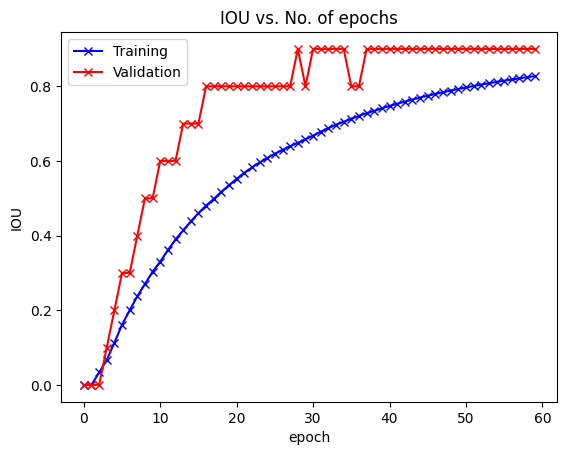

In [36]:
plot_iou(history_unet)

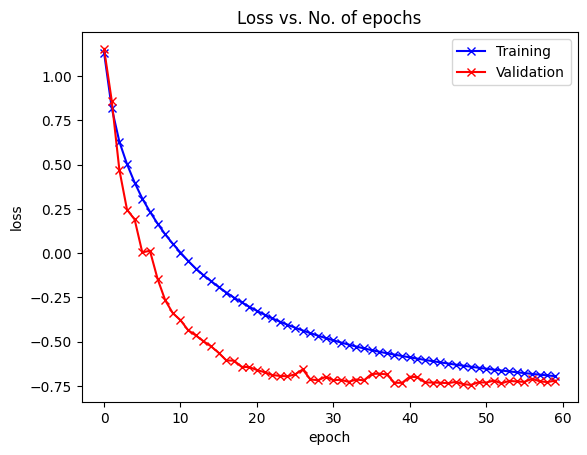

In [38]:
plot_losses(history_unet)

In [39]:
images, masks = next(iter(loaders['test']))

In [40]:
images.shape

torch.Size([10, 3, 256, 256])

In [41]:
test_output = unet(images.to(device).float())
test_output = test_output.to('cpu')
pred_y = torch.sigmoid(test_output)
pred_y[pred_y >= 0.5] = 1
pred_y[pred_y < 0.5] = 0

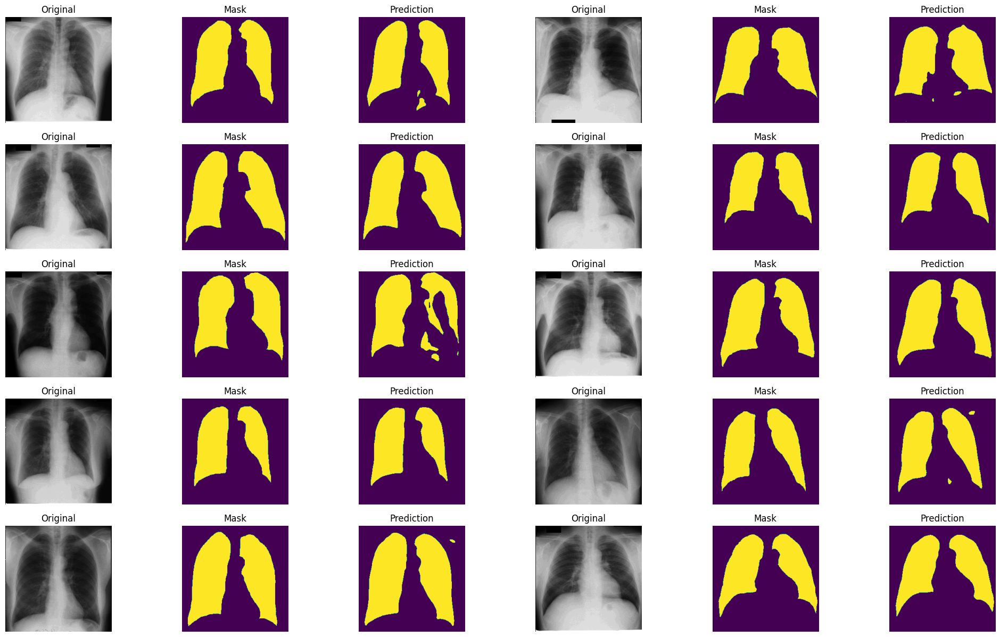

In [42]:
figure = plt.figure(figsize=(25, 15)) 
cols, rows = 6, 5
i = 0
for j in range(1, cols * rows + 1, 3):
    img, mask, pred = images[i], masks[i], pred_y[i]
    pred = pred.detach()
    figure.add_subplot(rows, cols, j)
    plt.title('Original')
    plt.axis("off")
    plt.imshow(img.permute(1,2,0))
    figure.add_subplot(rows, cols, j+1)
    plt.title('Mask')
    plt.axis("off")
    plt.imshow(mask.permute(1,2,0))
    figure.add_subplot(rows, cols, j+2)
    plt.title('Prediction')
    plt.axis("off")
    plt.imshow(pred.permute(1,2,0))
    i = i+1
plt.show()

In [43]:
torch.save(unet, '/home/msarava7/WarmUpExer/Segmentation01/semantic_unet_v2.pth')

# Task 6 - Instance Segmentation

#### Ground Truth Creation

In [184]:
# Read semantic segmentation groundtruths.
# Use skimage.measure.label function to separate out CC, which will label the left and right lung uniquely.
# Write the images back to a new folder. 
# Obtain bounding boxes for the new groundtruths and write them in a CSV file.

def instance_labelling_and_bb_fetching(input_image_mask):
    img = cv2.imread(input_image_mask, 0)
    instance_label = label(img)
    cpy_instance = instance_label
    bb_list = []
    label_cent = dict()
    label_ex = []
    xlist = []
    ylist = []
    # Fetching bounding boxes
    for region in regionprops(instance_label):
        centroid = region.centroid
        labelnm = region.label
        #print(labelnm, centroid)
        # take regions with large enough areas
        if region.area >= 1500 and centroid[0]<220 and centroid[0]>35: #and labelnm!=1:
            # draw rectangle around segmented coins
            x = centroid[1]
            xlist.append(x)
            y = centroid[0]
            if labelnm != 1:
                ylist.append(y)
            bb_list.append(labelnm)
            ymin, xmin, ymax, xmax = region.bbox
            bb_list.append(xmin)
            bb_list.append(ymin)
            bb_list.append(xmax)
            bb_list.append(ymax)
            label_cent[labelnm] = centroid
        else:
            label_ex.append(labelnm)
    #print(bb_list)
    #print(label_cent)
    #print(label_ex)
    llung = min(xlist)
    rlung = max(xlist)
    heart = max(ylist)
    for key, val in label_cent.items():
        #print("start")
        if val[0]==heart:
            #print("heart"+str(key))
            cpy_instance[cpy_instance==key] = 128#128#80
            bb_list[5] = 128
        elif val[1]==llung:
            #print("llung"+str(key))
            cpy_instance[cpy_instance==key] = 0#64
            bb_list[0] = 64
        elif val[1]==rlung:
            #print("rlung"+str(key))
            cpy_instance[cpy_instance==key] = 64#192#160
            bb_list[10] = 192
        else:
            #print("body"+str(key))
            cpy_instance[cpy_instance==key] = 255
            bb_list[0] = 255
            
    for value in label_ex:
        cpy_instance[cpy_instance==value]=0
    
    #for val in [60,70,80]:
    #    if val==70:
    #        cpy_instance[cpy_instance==val] = 3
    #        bb_list[5] = 3
    #    elif val==60:
    #        cpy_instance[cpy_instance==val] = 2
    #        bb_list[0] = 2
    #    elif val==80:
    #        cpy_instance[cpy_instance==val] = 4
    #        bb_list[10] = 4
    
        
    return cpy_instance, bb_list

def create_ground_truths(input_dir, output_dir, csv_file):
    parent_csv_header = ["file", "body-label", "body-xmin", "body-ymin", "body-xmax", "body-ymax",
                           "right_lung-label", "right_lung-xmin", "right_lung-ymin", "right_lung-xmax", "right_lung-ymax", 
                           "heart-label", "heart-xmin", "heart-ymin", "heart-xmax", "heart-ymax", 
                           "left_lung-label", "left_lung-xmin", "left_lung-ymin", "left_lung-xmax", "left_lung-ymax"]
    parent_csv_row_list = []
    for root_dir, dirs, files in os.walk(input_dir):
        for file in files:
            # Perform skimage label and bounding box identification.
            value_list = []
            instance_label, bb_list = instance_labelling_and_bb_fetching(os.path.join(root_dir, file))
            #instance_label = exposure.equalize_hist(instance_label)
            cv2.imwrite(os.path.join(output_dir, file),instance_label)
            value_list.append(file)
            print(file, len(bb_list))
            value_list.extend(bb_list)
            parent_csv_row_list.append(value_list)
        break
    parent_csv = pd.DataFrame(parent_csv_row_list, columns = parent_csv_header)
    parent_csv.to_csv(csv_file, index=False)

In [185]:
create_ground_truths(input_dir="/home/msarava7/WarmUpExer/segmentation02/segmentation/label_train", 
                     output_dir="/home/msarava7/WarmUpExer/segmentation02/segmentation/train/label", 
                     csv_file="/home/msarava7/WarmUpExer/segmentation02/segmentation/bb_train.csv")
create_ground_truths(input_dir="/home/msarava7/WarmUpExer/segmentation02/segmentation/label_test", 
                     output_dir="/home/msarava7/WarmUpExer/segmentation02/segmentation/test/label", 
                     csv_file="/home/msarava7/WarmUpExer/segmentation02/segmentation/bb_test.csv")

case121_label.png 20
case099_label.png 20
case141_label.png 20
case087_label.png 20
case145_label.png 20
case199_label.png 20
case156_label.png 20
case150_label.png 20
case189_label.png 20
case021_label.png 20
case050_label.png 20
case137_label.png 20
case010_label.png 20
case159_label.png 20
case009_label.png 20
case165_label.png 20
case161_label.png 20
case162_label.png 20
case181_label.png 20
case086_label.png 20
case027_label.png 20
case174_label.png 20
case148_label.png 20
case092_label.png 20
case114_label.png 20
case182_label.png 20
case052_label.png 20
case152_label.png 20
case064_label.png 20
case015_label.png 20
case108_label.png 20
case155_label.png 20
case166_label.png 20
case005_label.png 20
case187_label.png 20
case048_label.png 20
case074_label.png 20
case088_label.png 20
case049_label.png 20
case113_label.png 20
case058_label.png 20
case001_label.png 20
case038_label.png 20
case014_label.png 20
case115_label.png 20
case130_label.png 20
case072_label.png 20
case007_label

#### Ground Truth Writing Testing

In [132]:
img = cv2.imread('/home/msarava7/WarmUpExer/segmentation02/segmentation/label_train/case189_label.png', 0)
print(img.shape)
instance_label = label(img)
bb_list = []
# Fetching bounding boxes
for region in regionprops(instance_label):
    centroid = region.centroid
    # take regions with large enough areas
    if region.area >= 1500 and centroid[0]<220 and centroid[0]>35:
        # draw rectangle around segmented coins
        ymin, xmin, ymax, xmax = region.bbox
        bb_list.append(xmin)
        bb_list.append(ymin)
        bb_list.append(xmax)
        bb_list.append(ymax)
print(instance_label, bb_list)

(256, 256)
[[0 1 1 ... 1 1 1]
 [0 1 1 ... 1 1 1]
 [0 1 1 ... 1 1 1]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]] [0, 0, 256, 252, 134, 15, 241, 223, 10, 19, 110, 224, 83, 66, 206, 200]


In [133]:
cent1 = []
cent2 = []
for region in regionprops(instance_label):
    centroid = region.centroid
    if region.area >= 1500 and centroid[0]<220 and centroid[0]>35:
        print(region.label, region.centroid)
        cent1.append(region.centroid[0])
        cent2.append(region.centroid[1])

1 (134.75662758093296, 133.24219347438185)
2 (102.60816944024205, 189.21089258698942)
3 (111.42167454422687, 58.25295408507765)
4 (140.48615933189453, 135.29257764849396)


In [134]:
np.unique(instance_label)

array([0, 1, 2, 3, 4])

In [135]:
cent1

[134.75662758093296,
 102.60816944024205,
 111.42167454422687,
 140.48615933189453]

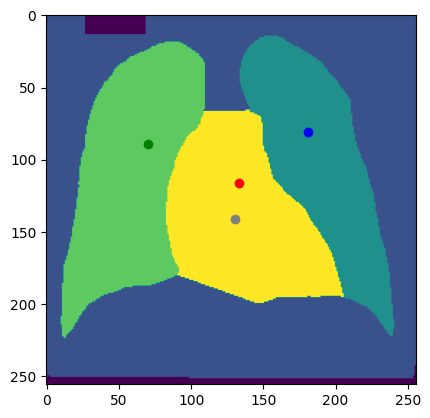

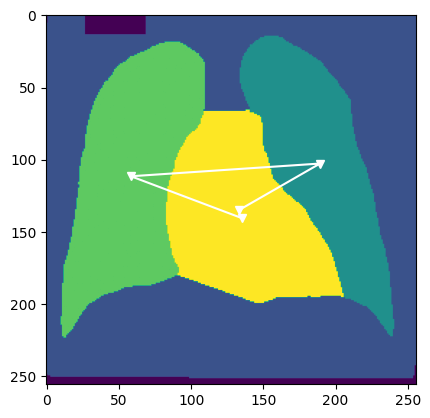

In [136]:
fig, ax = plt.subplots()
im = ax.imshow((instance_label))
ax.plot([133], [116], marker = 'o', color='red') #6
ax.plot([181], [81], marker = 'o', color='blue') #2
ax.plot([70], [89], marker = 'o', color='green') #3
ax.plot([130], [141], marker = 'o', color='gray') #1
plt.show()

plt.plot(cent2, cent1, marker='v', color="white")
plt.imshow(instance_label)
plt.show()

In [137]:
cpy_instance = instance_label
bb_list = []
label_cent = dict()
label_ex = []
xlist = []
ylist = []
# Fetching bounding boxes
for region in regionprops(instance_label):
    centroid = region.centroid
    labelnm = region.label
    print(labelnm, centroid)
    # take regions with large enough areas
    if region.area >= 1500 and centroid[0]<220 and centroid[0]>35: #and labelnm!=1:
        # draw rectangle around segmented coins
        x = centroid[1]
        xlist.append(x)
        y = centroid[0]
        if labelnm != 1:
            ylist.append(y)
        bb_list.append(labelnm)
        ymin, xmin, ymax, xmax = region.bbox
        bb_list.append(xmin)
        bb_list.append(ymin)
        bb_list.append(xmax)
        bb_list.append(ymax)
        label_cent[labelnm] = centroid
    else:
        label_ex.append(labelnm)
print(bb_list)
print(label_cent)
print(label_ex)
llung = min(xlist)
rlung = max(xlist)
heart = max(ylist)
for key, val in label_cent.items():
    print("start")
    if val[0]==heart:
        print("heart"+str(key))
        cpy_instance[cpy_instance==key] = 128
        bb_list[10] = 128
    elif val[1]==llung:
        print("llung"+str(key))
        cpy_instance[cpy_instance==key] = 64
        bb_list[5] = 64
    elif val[1]==rlung:
        print("rlung"+str(key))
        cpy_instance[cpy_instance==key] = 192
        bb_list[15] = 192
    else:
        print("body"+str(key))
        cpy_instance[cpy_instance==key] = 255
        bb_list[0] = 255
        
for value in label_ex:
    cpy_instance[cpy_instance==value]=255

1 (134.75662758093296, 133.24219347438185)
2 (102.60816944024205, 189.21089258698942)
3 (111.42167454422687, 58.25295408507765)
4 (140.48615933189453, 135.29257764849396)
[1, 0, 0, 256, 252, 2, 134, 15, 241, 223, 3, 10, 19, 110, 224, 4, 83, 66, 206, 200]
{1: (134.75662758093296, 133.24219347438185), 2: (102.60816944024205, 189.21089258698942), 3: (111.42167454422687, 58.25295408507765), 4: (140.48615933189453, 135.29257764849396)}
[]
start
body1
start
rlung2
start
llung3
start
heart4


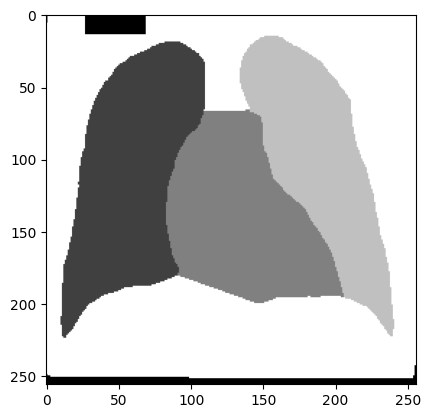

In [138]:
plt.imshow(cpy_instance, cmap="gray")

In [139]:
bb_list

[255,
 0,
 0,
 256,
 252,
 64,
 134,
 15,
 241,
 223,
 128,
 10,
 19,
 110,
 224,
 192,
 83,
 66,
 206,
 200]

In [29]:
np.unique(cpy_instance)

array([  0,  64, 128, 192, 255])

In [31]:
type(cpy_instance)

numpy.ndarray

In [32]:
cpy_instance.shape

(256, 256)

In [33]:
maskids = np.unique(cpy_instance)
maskids

array([  0,  64, 128, 192, 255])

In [34]:
maskids = maskids[1:]
maskids[:, None, None]

array([[[ 64]],

       [[128]],

       [[192]],

       [[255]]])

In [35]:
print(maskids[:,None, None].shape)
cpy_instance == maskids[:, None, None]

(4, 1, 1)


array([[[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]],

       [[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]],

       [[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, Fal

In [36]:
(cpy_instance == maskids[:, None, None]) * 255

array([[[  0,   0,   0, ...,   0,   0,   0],
        [  0,   0,   0, ...,   0,   0,   0],
        [  0,   0,   0, ...,   0,   0,   0],
        ...,
        [  0,   0,   0, ...,   0,   0,   0],
        [  0,   0,   0, ...,   0,   0,   0],
        [  0,   0,   0, ...,   0,   0,   0]],

       [[  0,   0,   0, ...,   0,   0,   0],
        [  0,   0,   0, ...,   0,   0,   0],
        [  0,   0,   0, ...,   0,   0,   0],
        ...,
        [  0,   0,   0, ...,   0,   0,   0],
        [  0,   0,   0, ...,   0,   0,   0],
        [  0,   0,   0, ...,   0,   0,   0]],

       [[  0,   0,   0, ...,   0,   0,   0],
        [  0,   0,   0, ...,   0,   0,   0],
        [  0,   0,   0, ...,   0,   0,   0],
        ...,
        [  0,   0,   0, ...,   0,   0,   0],
        [  0,   0,   0, ...,   0,   0,   0],
        [  0,   0,   0, ...,   0,   0,   0]],

       [[  0,   0,   0, ..., 255, 255,   0],
        [  0,   0,   0, ..., 255, 255,   0],
        [  0,   0,   0, ..., 255,   0,   0],
        ..

#### Dataset fetching

In [186]:
def preprocess(image, input_size, augmentation=True):
    if augmentation:
        aug_transform = transforms.Compose([
            transforms.ToPILImage(),
            transforms.Resize((input_size, input_size)),
            transforms.RandomHorizontalFlip(p=0.5),
            transforms.RandomRotation((0,180)),
            transforms.ToTensor(),
        ])
    else:
        aug_transform = transforms.Compose([
            transforms.ToPILImage(),
            transforms.Resize((input_size, input_size)),
            transforms.ToTensor(),
        ])

    result = aug_transform(image)
    return result

In [187]:
class DatasetLoader(Dataset):
    def __init__(self, data_root, input_size, augment, histogram_eq=''):
        self.input_size = input_size
        self.augment = augment
        self.data_root = data_root
        self.histogram_eq = histogram_eq
        filenames = []
        self.image_data = pd.DataFrame()
        for directory, _,files in os.walk(os.path.join(self.data_root, 'org')):
            for file in files:
                filenames.append(file.split('.')[0])
            self.image_data = pd.DataFrame(filenames, index = np.arange(0, len(filenames)), columns = ['image_name'])
            break

    def __len__(self):
        return len(self.image_data)

    def __getitem__(self, idx):
        image_name = self.image_data.loc[idx,:].image_name
        image = cv2.imread(os.path.join(self.data_root, 'org', image_name+'.bmp'))
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = preprocess(image, self.input_size, self.augment)
        mask = cv2.imread(os.path.join(self.data_root, 'label'+self.histogram_eq, image_name+'_label.png'), cv2.IMREAD_GRAYSCALE)
        #mask = cv2.equalizeHist(mask)
        mask = cv2.cvtColor(mask, cv2.COLOR_GRAY2RGB)
        mask = preprocess(mask, self.input_size, self.augment)
        #masknp = np.array(mask)
        # instances are encoded as different colors
        #maskids = np.unique(masknp)
        #maskids = maskids[1:]
        #masks = (masknp == maskids[:, None, None])*255
        #masks = torch.as_tensor(masks, dtype=torch.uint8)
        return image_name, image, mask#s


In [188]:
train_path = '/home/msarava7/WarmUpExer/segmentation02/segmentation/train/'
test_path = '/home/msarava7/WarmUpExer/segmentation02/segmentation/test/'

In [189]:
input_size = 256
augment = False

In [190]:
train_val = DatasetLoader(train_path, input_size, augment)
test_data = DatasetLoader(test_path, input_size, augment)

In [191]:
data_list = {'train':train_val, 'test':test_data}

In [192]:
for key in data_list:
  print(key,':',data_list[key].__len__())

train : 198
test : 48


In [193]:
name, img, mask = train_val.__getitem__(22)
print(img.shape, mask.shape)

torch.Size([3, 256, 256]) torch.Size([3, 256, 256])


In [194]:
name, img, mask = test_data.__getitem__(22)
print(img.shape, mask.shape)

torch.Size([3, 256, 256]) torch.Size([3, 256, 256])


In [195]:
def display_img(name, img,mask):
    figure = plt.figure(figsize=(10, 5))
    figure.add_subplot(1, 2, 1)
    plt.title('Original '+name)
    plt.imshow(img.permute(1,2,0))
    figure.add_subplot(1, 2, 2)
    plt.title('Mask')
    plt.imshow(mask.permute(1,2,0))#, cmap="gray")

165


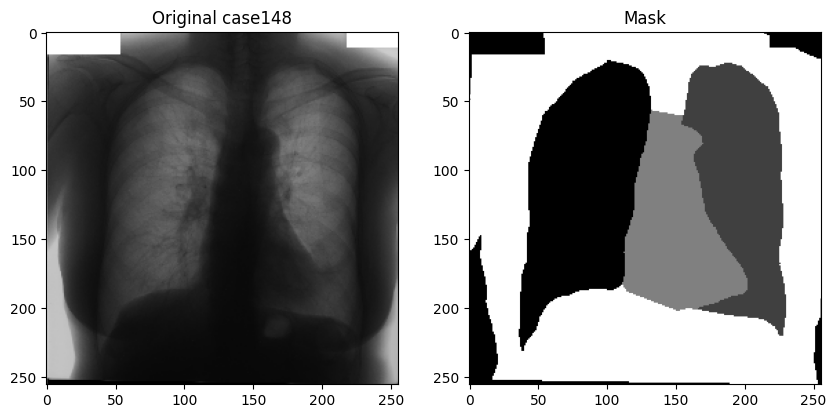

In [196]:
idx = random.randint(0,len(train_val))
print(idx)
display_img(*train_val[idx])

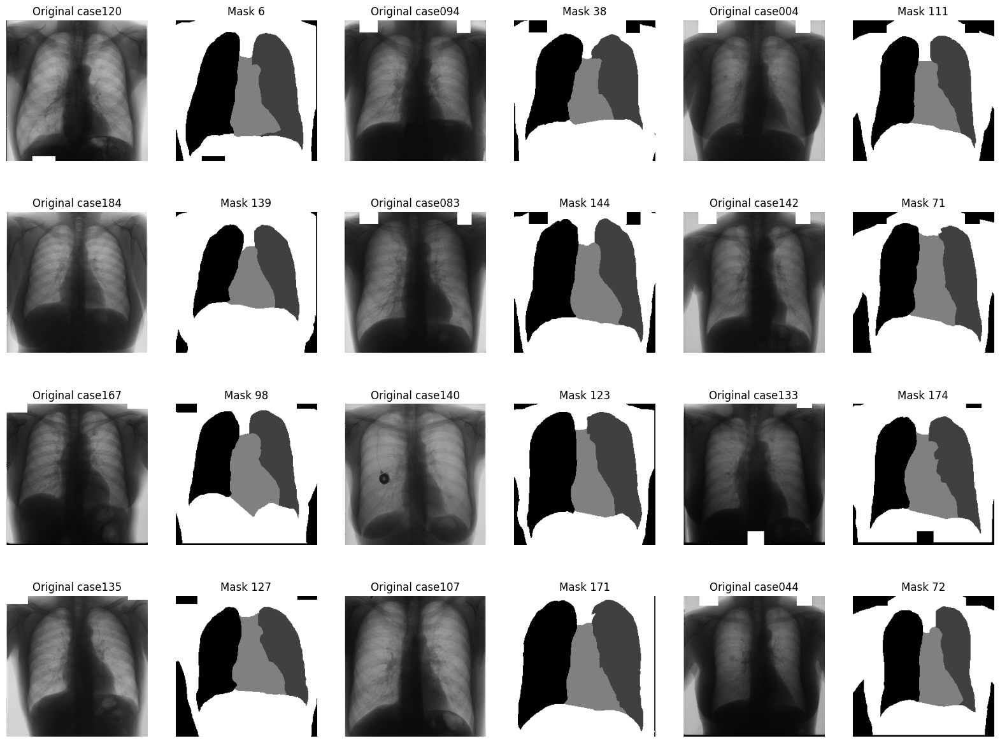

In [197]:
figure = plt.figure(figsize=(20, 15)) 
cols, rows = 6, 4
for i in range(1, cols * rows + 1, 2):
    sample_idx = torch.randint(len(train_val), size=(1,)).item() 
    name, img, mask = train_val[sample_idx]
    figure.add_subplot(rows, cols, i)
    plt.title('Original '+ name)
    plt.axis("off")
    plt.imshow(img.permute(1,2,0))
    figure.add_subplot(rows, cols, i+1)
    plt.title('Mask '+str(sample_idx))
    plt.axis("off")
    plt.imshow(mask.permute(1,2,0))#.type(torch.ByteTensor))
plt.show()

In [198]:
random_seed = 267
torch.manual_seed(random_seed)

In [199]:
val_size = int(0.2 * len(train_val))
print(val_size)
train_size = len(train_val) - val_size
print(train_size)

39
159


In [200]:
train_data, val_data = random_split(train_val,[train_size,val_size])
print(f"Length of Train Data : {len(train_data)}")
print(f"Length of Validation Data : {len(val_data)}")

Length of Train Data : 159
Length of Validation Data : 39


In [201]:
batch = 8

In [202]:
loaders = {'train': DataLoader(train_data, batch_size=batch, shuffle=True, num_workers=1),
           'val': DataLoader(val_data, batch_size=batch, shuffle=True, num_workers=1),
           'test' : DataLoader(test_data, batch_size=batch, shuffle=True, num_workers=1)}
loaders

{'train': <torch.utils.data.dataloader.DataLoader at 0x2b10b574f910>,
 'val': <torch.utils.data.dataloader.DataLoader at 0x2b10b574fb10>,
 'test': <torch.utils.data.dataloader.DataLoader at 0x2b10b574f710>}

## Base Model

In [203]:
class Base(nn.Module):
    def training_step(self, batch, loss_func):
        names, images, labels = batch
        images = images.to(device).float()
        labels = labels.to(device)
        output = self(images)
        train_loss = loss_func(output.float().clone(), labels.float().clone())
        train_iou = iou(output, labels)
        del images, labels, output
        return {'train_loss': train_loss, 'train_iou': train_iou}
    
    def validation_step(self, batch, loss_func):
        names, images, labels = batch
        images = images.to(device).float()
        labels = labels.to(device)
        output = self(images)
        val_loss = loss_func(output.float().clone(), labels.float().clone())
        val_iou = iou(output, labels)
        del images, labels, output
        return {'val_loss': val_loss.detach(), 'val_iou': val_iou}

    def validation_epoch_end(self, outputs):
        batch_loss = [x['val_loss'] for x in outputs]
        epoch_loss = torch.stack(batch_loss).mean()
        batch_iou = [x['val_iou'] for x in outputs]
        epoch_iou = torch.stack(batch_iou).mean()
        return {'loss': epoch_loss.item(), 'iou': epoch_iou.item()}

    def epoch_end(self, epoch, result):
        print("Epoch [{}], train_loss: {:.4f}, train_iou: {:.4f}, val_loss: {:.4f}, val_iou: {:.4f}".format(
                epoch, result['train_loss'], result['train_iou'], result['loss'], result['iou']))


In [204]:
class BCEDiceLoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(BCEDiceLoss, self).__init__()

    def forward(self, outputs, labels, smooth=1):
        
        #comment out if your model contains a sigmoid or equivalent activation layer
        outputs = torch.sigmoid(outputs)       
        
        #flatten label and prediction tensors
        outputs = outputs.view(-1)
        labels = labels.view(-1)
        
        intersection = (outputs * labels).sum()                            
        dice_loss = 1 - (2.*intersection + smooth)/(outputs.sum() + labels.sum() - intersection + smooth)  
        BCE = nn.functional.binary_cross_entropy(outputs, labels, reduction='mean')
        BCE_Dice = BCE + dice_loss
        
        return dice_loss#BCE_Dice

In [205]:
def dice_loss(input, target):
    input = torch.sigmoid(input)
    smooth = 1.0
    iflat = input.view(-1)
    tflat = target.view(-1)
    intersection = (iflat * tflat).sum()
    return ((2.0 * intersection + smooth) / (iflat.sum() + tflat.sum() + smooth))


class FocalLoss(nn.Module):
    def __init__(self, gamma):
        super().__init__()
        self.gamma = gamma

    def forward(self, input, target):
        if not (target.size() == input.size()):
            raise ValueError("Target size ({}) must be the same as input size ({})"
                             .format(target.size(), input.size()))
        max_val = (-input).clamp(min=0)
        loss = input - input * target + max_val + \
            ((-max_val).exp() + (-input - max_val).exp()).log()
        invprobs = torch.nn.functional.logsigmoid(-input * (target * 2.0 - 1.0))
        loss = (invprobs * self.gamma).exp() * loss
        return loss.mean()


class MixedLoss(nn.Module):
    def __init__(self, alpha, gamma):
        super().__init__()
        self.alpha = alpha
        self.focal = FocalLoss(gamma)

    def forward(self, input, target):
        loss = self.alpha*self.focal(input, target) - torch.log(dice_loss(input, target))
        return loss.mean()

In [206]:
class RAdam(optim.Optimizer):

    def __init__(self, params, lr=1e-3, betas=(0.9, 0.999), eps=1e-8, weight_decay=0):
        if not 0.0 <= lr:
            raise ValueError("Invalid learning rate: {}".format(lr))
        if not 0.0 <= eps:
            raise ValueError("Invalid epsilon value: {}".format(eps))
        if not 0.0 <= betas[0] < 1.0:
            raise ValueError("Invalid beta parameter at index 0: {}".format(betas[0]))
        if not 0.0 <= betas[1] < 1.0:
            raise ValueError("Invalid beta parameter at index 1: {}".format(betas[1]))
            
        defaults = dict(lr=lr, betas=betas, eps=eps, weight_decay=weight_decay)
        self.buffer = [[None, None, None] for ind in range(10)]
        super(RAdam, self).__init__(params, defaults)

    def __setstate__(self, state):
        super(RAdam, self).__setstate__(state)

    def step(self, closure=None):

        loss = None
        if closure is not None:
            loss = closure()

        for group in self.param_groups:

            for p in group['params']:
                if p.grad is None:
                    continue
                grad = p.grad.data.float()
                if grad.is_sparse:
                    raise RuntimeError('RAdam does not support sparse gradients')

                p_data_fp32 = p.data.float()

                state = self.state[p]

                if len(state) == 0:
                    state['step'] = 0
                    state['exp_avg'] = torch.zeros_like(p_data_fp32)
                    state['exp_avg_sq'] = torch.zeros_like(p_data_fp32)
                else:
                    state['exp_avg'] = state['exp_avg'].type_as(p_data_fp32)
                    state['exp_avg_sq'] = state['exp_avg_sq'].type_as(p_data_fp32)

                exp_avg, exp_avg_sq = state['exp_avg'], state['exp_avg_sq']
                beta1, beta2 = group['betas']

                exp_avg_sq.mul_(beta2).addcmul_(1 - beta2, grad, grad)
                exp_avg.mul_(beta1).add_(1 - beta1, grad)

                state['step'] += 1
                buffered = self.buffer[int(state['step'] % 10)]
                if state['step'] == buffered[0]:
                    N_sma, step_size = buffered[1], buffered[2]
                else:
                    buffered[0] = state['step']
                    beta2_t = beta2 ** state['step']
                    N_sma_max = 2 / (1 - beta2) - 1
                    N_sma = N_sma_max - 2 * state['step'] * beta2_t / (1 - beta2_t)
                    buffered[1] = N_sma

                    # more conservative since it's an approximated value
                    if N_sma >= 5:
                        step_size = math.sqrt((1 - beta2_t) * (N_sma - 4) / (N_sma_max - 4) * (N_sma - 2) / N_sma * N_sma_max / (N_sma_max - 2)) / (1 - beta1 ** state['step'])
                    else:
                        step_size = 1.0 / (1 - beta1 ** state['step'])
                    buffered[2] = step_size

                if group['weight_decay'] != 0:
                    p_data_fp32.add_(-group['weight_decay'] * group['lr'], p_data_fp32)

                # more conservative since it's an approximated value
                if N_sma >= 5:            
                    denom = exp_avg_sq.sqrt().add_(group['eps'])
                    p_data_fp32.addcdiv_(-step_size * group['lr'], exp_avg, denom)
                else:
                    p_data_fp32.add_(-step_size * group['lr'], exp_avg)

                p.data.copy_(p_data_fp32)

        return loss

In [207]:
def iou(outputs, labels, smooth = 1e-6):
    # You can comment out this line if you are passing tensors of equal shape
    # But if you are passing output from UNet or something it will most probably
    # be with the BATCH x 1 x H x W shape
    #outputs = outputs.squeeze(1)  # BATCH x 1 x H x W => BATCH x H x W
    
    outputs = torch.sigmoid(outputs)
    intersection = (outputs * labels).sum() #(outputs.detach() & labels).sum((1, 2))
    union = outputs.sum() + labels.sum() - intersection #(outputs.detach() | labels).sum((1, 2))
    
    iou = (intersection + smooth) / (union + smooth)  # We smooth our devision to avoid 0/0
    
    thresholded = torch.clamp(20 * (iou - 0.5), 0, 10).ceil() / 10  # This is equal to comparing with thresolds
    
    return thresholded 

In [208]:
def mIOU(pred, label, num_classes=1):
    pred = nn.functional.softmax(pred, dim=1)              
    pred = torch.argmax(pred, dim=1).squeeze(1)
    iou_list = list()
    present_iou_list = list()

    pred = pred.view(-1)
    label = label.view(-1)
    
    for sem_class in [0,60,70,80]:
        pred_inds = (pred == sem_class)
        target_inds = (label == sem_class)
        if target_inds.long().sum().item() == 0:
            iou_now = float('nan')
        else: 
            intersection_now = (pred_inds[target_inds]).long().sum().item()
            union_now = pred_inds.long().sum().item() + target_inds.long().sum().item() - intersection_now
            iou_now = float(intersection_now) / float(union_now)
            present_iou_list.append(iou_now)
        iou_list.append(iou_now)
    return torch.as_tensor(np.mean(present_iou_list))

In [209]:
def auc_roc(outputs, labels, list_flag):
    if list_flag==0:
      preds = torch.sigmoid(outputs)
      preds = preds.to('cpu').detach()
      labels = labels.to('cpu').detach()
    else:
      preds = outputs
      #print(len(preds))
      #print(len(labels))
      preds = preds#[0]
      labels = labels#[0]
    #print('auc')
    #print(labels)
    #print(preds)
    auc = roc_auc_score(labels, preds, average='micro', multi_class='ovr')
    del outputs, labels, preds
    return auc

In [210]:
def evaluate(model, val_loader, loss_func):
    model.eval()
    outputs = [model.validation_step(batch, loss_func) for batch in val_loader]#tqdm(val_loader)]
    return model.validation_epoch_end(outputs)

In [211]:
def model_fit(num_epochs, model, loaders, loss_func, optimizer, scheduler):
    history = []
    train_batch_loss = []
    train_batch_iou = []
    torch.autograd.set_detect_anomaly(True)
    
    for epoch in range(num_epochs):
        model.train()
        for batch in loaders['train']:#tqdm(loaders['train']):
            train_step_res = model.training_step(batch, loss_func)
            train_step_loss = train_step_res['train_loss']
            train_batch_loss.append(train_step_loss)
            train_batch_iou.append(train_step_res['train_iou'])
            # clear gradients for this training step
            optimizer.zero_grad()
            # backpropagation, compute gradients
            train_step_loss.backward()
            # apply gradients
            optimizer.step()
        #scheduler.step()
        result = evaluate(model, loaders['val'], loss_func)
        scheduler.step()
        result['train_loss'] = torch.stack(train_batch_loss).mean().item()
        result['train_iou'] = torch.stack(train_batch_iou).mean().item()
        model.epoch_end(epoch, result)
        history.append(result)
    return history

In [212]:
num_epochs = 30
loss_func = MixedLoss(alpha = 10.0,gamma = 2.0)#BCEDiceLoss()
print(loss_func)

MixedLoss(
  (focal): FocalLoss()
)


In [213]:
def plot_iou(history):
    """ Plot the history of iou"""
    train_iou = [x['train_iou'] for x in history]
    val_iou = [x['iou'] for x in history]
    plt.plot(train_iou, '-bx')
    plt.plot(val_iou, '-rx')
    plt.xlabel('epoch')
    plt.ylabel('IOU')
    plt.legend(['Training', 'Validation'])
    plt.title('IOU vs. No. of epochs')

In [214]:
def plot_losses(history):
    """ Plot the losses in each epoch"""
    train_losses = [x.get('train_loss') for x in history]
    val_losses = [x['loss'] for x in history]
    plt.plot(train_losses, '-bx')
    plt.plot(val_losses, '-rx')
    plt.xlabel('epoch')
    plt.ylabel('loss')
    plt.legend(['Training', 'Validation'])
    plt.title('Loss vs. No. of epochs');

## UNet

##### UNet Training

In [215]:
class Unet(Base):
    def __init__(self):
        super(Unet, self).__init__()

        unet = smp.model = smp.Unet('resnet18', encoder_weights='imagenet', classes=3, 
                                    activation=None, encoder_depth=3, decoder_channels=[64, 32, 16])
        
        self.unet = unet
    
    def forward(self, x):
        output = self.unet(x)
        return output

In [216]:
unet = Unet()
unet = unet.to(device)

In [217]:
optimizerUnet = optim.RMSprop(unet.parameters(), lr = 0.0009)#optim.Adam(unet.parameters(), lr = 0.001) 
schedulerUnet = optim.lr_scheduler.StepLR(optimizerUnet, step_size=30, gamma=0.1)
print(optimizerUnet)

RMSprop (
Parameter Group 0
    alpha: 0.99
    centered: False
    eps: 1e-08
    initial_lr: 0.0009
    lr: 0.0009
    momentum: 0
    weight_decay: 0
)


In [218]:
history_unet = model_fit(num_epochs, unet, loaders, loss_func, optimizerUnet, schedulerUnet)

Epoch [0], train_loss: 1.4999, train_iou: 0.1150, val_loss: 1.3624, val_iou: 0.2000
Epoch [1], train_loss: 1.1888, train_iou: 0.2325, val_loss: 1.5737, val_iou: 0.4200
Epoch [2], train_loss: 1.0470, train_iou: 0.2950, val_loss: 0.8133, val_iou: 0.3800
Epoch [3], train_loss: 0.9560, train_iou: 0.3387, val_loss: 0.6348, val_iou: 0.4800
Epoch [4], train_loss: 0.8927, train_iou: 0.3700, val_loss: 0.7388, val_iou: 0.4400
Epoch [5], train_loss: 0.8445, train_iou: 0.3967, val_loss: 0.7086, val_iou: 0.4800
Epoch [6], train_loss: 0.8076, train_iou: 0.4171, val_loss: 0.5318, val_iou: 0.5600
Epoch [7], train_loss: 0.7734, train_iou: 0.4381, val_loss: 0.5292, val_iou: 0.6000
Epoch [8], train_loss: 0.7467, train_iou: 0.4544, val_loss: 0.5195, val_iou: 0.6000
Epoch [9], train_loss: 0.7235, train_iou: 0.4680, val_loss: 0.5370, val_iou: 0.5800
Epoch [10], train_loss: 0.7039, train_iou: 0.4795, val_loss: 1.1255, val_iou: 0.4400
Epoch [11], train_loss: 0.6856, train_iou: 0.4896, val_loss: 0.4865, val_io

##### Unet Testing

In [219]:
print(f'Test accuracy of the {test_data.__len__()} images:')
evaluate(unet, loaders['test'], loss_func)

Test accuracy of the 48 images:


{'loss': 0.46702882647514343, 'iou': 0.6666666865348816}

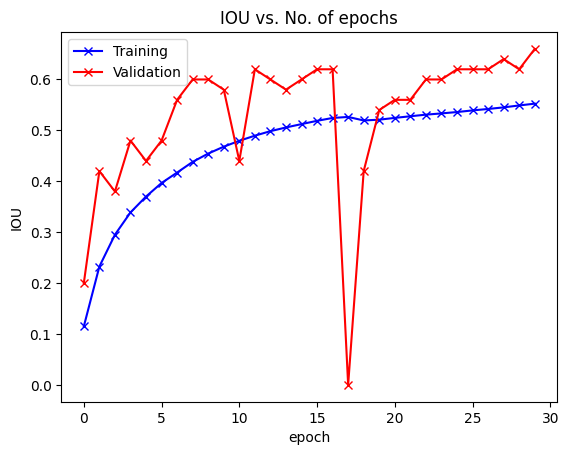

In [220]:
plot_iou(history_unet)

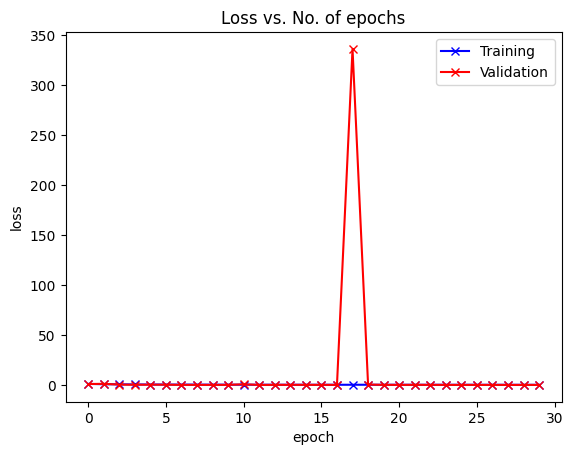

In [221]:
plot_losses(history_unet)

In [222]:
names, images, masks = next(iter(loaders['test']))

In [251]:
names

('case234',
 'case225',
 'case208',
 'case216',
 'case202',
 'case204',
 'case209',
 'case239')

In [223]:
np.unique(masks[0])

array([0.       , 0.2509804, 0.5019608, 1.       ], dtype=float32)

In [224]:
images.shape

torch.Size([8, 3, 256, 256])

In [225]:
test_output = unet(images.to(device).float())
test_output = test_output.to('cpu')
test_output.shape
#out = test_output * 255

torch.Size([8, 3, 256, 256])

In [226]:
pred_y = torch.sigmoid(test_output)
predclipped = pred_y.clone()
predclipped[predclipped>=0.7]=1
predclipped[(predclipped<0.7) & (predclipped>=0.4)]=0.65
predclipped[(predclipped<0.4) & (predclipped>=0.15)]=0.3
predclipped[(predclipped<0.15)]=0

In [227]:
np.unique(pred_y.detach().cpu().numpy())

array([3.6135535e-07, 3.7423490e-07, 4.1204291e-07, ..., 9.9992859e-01,
       9.9992883e-01, 9.9992931e-01], dtype=float32)

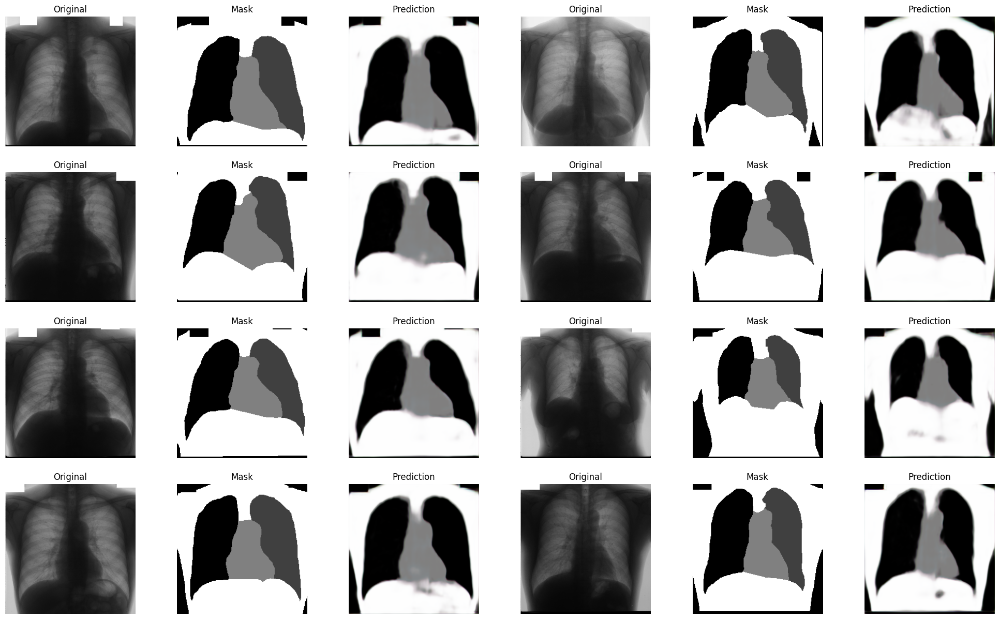

In [231]:
figure = plt.figure(figsize=(25, 15)) 
cols, rows = 6, 4
i = 0
for j in range(1, cols * rows + 1, 3):
    img, mask, pred = images[i], masks[i], pred_y[i]
    pred = pred.detach()
    figure.add_subplot(rows, cols, j)
    plt.title('Original')
    plt.axis("off")
    plt.imshow(img.permute(1,2,0))
    figure.add_subplot(rows, cols, j+1)
    plt.title('Mask')
    plt.axis("off")
    plt.imshow(mask.permute(1,2,0), cmap="gray")
    figure.add_subplot(rows, cols, j+2)
    plt.title('Prediction')
    plt.axis("off")
    plt.imshow(pred.permute(1,2,0), cmap="gray")
    i = i+1
plt.show()

In [229]:
torch.save(unet, '/home/msarava7/WarmUpExer/segmentation02/segmentation/instance_unet_v3.pth')

In [252]:
def get_y_test_pred(loader, model, device):
    counter = 0
    os.makedirs('/home/msarava7/WarmUpExer/segmentation02/segmentation/new_results/')
    img_pth = '/home/msarava7/WarmUpExer/segmentation02/segmentation/new_results/'
    #img_nm = 'image_'
    for names, images, masks in loader:
        output = model(images.to(device).float()).to('cpu')
        predictions = torch.sigmoid(test_output)
        for key, pred in enumerate(predictions):
            pred = pred.permute(1,2,0).detach().numpy()
            (pred.shape)
            pth = img_pth+names[key]+'.png'
            cv2.imwrite(pth,pred)
            counter = counter+1

In [253]:
get_y_test_pred(loaders['test'], unet, device)